# Term Project: Stock Market Trading Using Data Mining and Machine Learning Techniques

### Team 1
#### Souhib Trabelsi
#### Jon Turdiev
#### Yuecan Li
#### CSC 869 - Data Mining
#### San Francisco State University, Department of Computer Science, MSCS Spring 2021

---
# Table of Contents
# 1. Introduction
# 2. Data Acquisition and Analysis
## 2.1. High-tech Industry
## 2.2. Automotive Industry
## 2.3. Technical Indicators
# 3. Stock Price Prediction
## 3.1. Moving Average
## 3.2. Adaptive Exponential Smoothing
## 3.3. LSTM
## 3.4. ARIMA
## 3.5. Linear Regression
## 3.6. Decision Tree
## 3.7. Facebook Prophet
## 3.8. Predictor Evaluation
# 4. Stock Signal Generation
## 4.1. Class Labeling Strategies
### 4.1.1. Daily Percentage Change
### 4.1.2. Moving Average Crossover
### 4.1.3. Local Peaks
## 4.2. Top-Down Approach with LSTM
## 4.3. AutoKeras
## 4.4. Method Evaluation
# 5. Stock Trade Simulations
## 5.1. Simulations for High-tech Industry
## 5.2. Simulations for Automotive Industry
# 6. Conclusion
# 7. References

---
# 1. Introduction

In this project, we applied data mining and machine learning techniques to predict stock prices and to create buy/sell/hold signals with the purpose of maximizing profits from stock trading. We conducted technical analysis and risk assessment of the high-tech and automotive industry stocks. Several algorithms were applied for price prediction, obtaining high accuracy in short term predictions. Three financial strategies were used to establish ground truth to determine the optimal action to take with the given stock trend, momentum, and forecast values. The Top-down approach using the LSTM model was applied to predict signals that were evaluated using F-score, precision, recall values as well as trade simulations. AutoKeras was used to further improve the results by determining the best model and optimal hyperparameters.

# 2. Data Acquisition and Analysis

In [242]:
# Imports
import pandas as pd
import numpy as np
import math
from datetime import datetime

import matplotlib.pyplot as plt
import seaborn as sns

# For reading stock data from yahoo
from pandas_datareader.data import DataReader
# Pandas TA - A Technical Analysis Library in Python 3
import pandas_ta as ta
# FB Prophet
from prophet import Prophet
# SciPy
from scipy.signal import find_peaks
# SciKitLearn
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import ConfusionMatrixDisplay
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeRegressor
# Keras
from keras.models import Sequential
from keras.layers import Dense, LSTM
from keras import utils
# Arima
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.arima_model import ARIMA
from pmdarima.arima import auto_arima
# AutoKeras
import platform
if platform.system() == "Linux":
    import autokeras as ak
    import tensorflow as tf
    
# Hide warnigns
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

In [243]:
# Get stock data for the given companies.
def get_stocks(companies: dict, start: datetime, end: datetime):
    # Stock data for each company.
    stocks = {}

    # Obtain data.
    for name, ticker in companies.items():   
        # Set DataFrame as the Stock Ticker
        stocks[name] = DataReader(ticker, 'yahoo', start, end)
    return stocks

# Shows stock closing prices graph for given industry and stocks.
def display_stock_close_prices(industry_index, stocks: dict):
    # Plot closing prices of industry index, then each company.
    industry_index['Adj Close'].plot(figsize=(20, 5))
    plt.suptitle('Adj Close')
       
    plt.figure(figsize=(20, 10))   
    plt.subplots_adjust(top=.9, bottom=.8)

    i = 1
    for name, data in stocks.items():
        plt.subplot(2, 2, i)
        i +=1
        data['Adj Close'].plot()
        plt.ylabel('Adj Close')
        plt.xlabel(None)
        plt.title(name)

# Shows stock volume being traded for given stocks.
def display_stock_volumes(stocks: dict):
    plt.figure(figsize=(20, 10))
    plt.subplots_adjust(top=.9, bottom=.8)
    plt.suptitle('Volumes')
    
    i = 1
    for name, data in stocks.items():
        plt.subplot(2, 2, i)
        i += 1
        data['Volume'].plot()
        plt.ylabel('Volume')
        plt.xlabel(None)
        plt.title(name)

# Shows daily return as percentage change from previous day.
def display_daily_return_percentage(stocks: dict):
    plt.figure(figsize=(20, 15))
    plt.subplots_adjust(top=.9, bottom=.8)
    plt.suptitle('Daily Returns Percentage')

    i = 1
    for name, data in stocks.items():
        plt.subplot(2, 2, i)
        i += 1
        data['Daily Return'] = data['Adj Close'].pct_change()
        data['Daily Return'].plot(linestyle='--', marker='o')
        plt.title(name)

# Shows daily return as histogram.
def display_daily_return_histogram(stocks: dict):
    plt.figure(figsize=(20, 10))
    # plt.subplots_adjust(top=.9, bottom=.8)
    plt.suptitle('Daily Returns Histogram')

    i = 1
    for name, data in stocks.items():
        plt.subplot(2, 2, i)
        i += 1
        data['Daily Return'] = data['Adj Close'].pct_change()
        sns.histplot(data['Daily Return'].dropna(), bins=100, color='purple')
        plt.title(name)

# Shows daily return and adj. close correlations among companies.
def display_pairplot_and_correlation_between_companies(companies: dict, start: datetime, end: datetime):
    # Grab all the closing prices for the tech stock list into one DataFrame
    closing_df = DataReader(list(companies.values()), 'yahoo', start, end)['Adj Close']

    # Make a new tech returns DataFrame
    returns = closing_df.pct_change()

    # Plot daily returns correlations.
    sns.pairplot(returns, kind='reg', height=4)
    plt.suptitle('Daily Returns Correlation')
    plt.show()
    sns.heatmap(returns.corr(), annot=True, cmap='summer')
    plt.suptitle('Daily Returns Correlation')
    plt.show()
    sns.heatmap(closing_df.corr(), annot=True, cmap='summer')
    plt.suptitle('Adj Close Correlation')
    plt.show()

# Shows simple risk evaluations for companies.
def display_risk(companies: dict, start: datetime, end: datetime):
    # There are many ways we can quantify risk, one of the most basic ways using the information we've gathered on 
    # daily percentage returns is by comparing the expected return with the standard deviation of the daily returns.
    closing_df = DataReader(list(companies.values()), 'yahoo', start, end)['Adj Close']
    returns = closing_df.pct_change()
    returns.dropna(inplace=True)

    area = np.pi*20

    plt.figure(figsize=(12, 10))
    plt.suptitle('Risk')
    plt.scatter(returns.mean(), returns.std(), s=area)
    plt.xlabel('Expected return')
    plt.ylabel('Risk')

    for label, x, y in zip(returns.columns, returns.mean(), returns.std()):
        plt.annotate(label, xy=(x, y), xytext=(50, 50), textcoords='offset points', ha='right', va='bottom', 
                     arrowprops=dict(arrowstyle='-', color='blue', connectionstyle='arc3,rad=-0.3'))
    plt.show()

def display_return_comparison(companies: dict, start: datetime, end: datetime):
    # Above black line = current stock price is higher than the first one
    # Below black line = current stock price is lower than the first one
    # (Might be better with smaller date range)
    df_companies = DataReader(list(companies.values()), 'yahoo', start, end)['Adj Close']
    companies_list = df_companies.columns.to_list()
    dict_adj_close_tech = {}

    for companie in companies_list:
        dict_adj_close_tech[companie] = df_companies[companie]
  
    stocks_adj_close_tech = pd.DataFrame(dict_adj_close_tech)
    stock_return = stocks_adj_close_tech.apply(lambda x: x / x[0])
    stock_return.plot(grid = True, figsize=(30,20)).axhline(y = 1, color = "black", lw = 4)
    plt.rcParams.update(plt.rcParamsDefault)
    sns.set(style='darkgrid',)
    plt.suptitle('Return Comparisons')
    plt.show()

def display_null_values(companies: str, start: datetime, end: datetime):
    # Checking if we have null values
    closing_df = DataReader(list(companies.values()), 'yahoo', start, end)['Adj Close']
    sns.heatmap(closing_df.isnull(), yticklabels=False, cbar=False, cmap='viridis')
    plt.suptitle('Missing Ajd Close Information')
    plt.show()

def display_viz(industry_idx: str, companies: dict, start: datetime, end: datetime):
    # Industy Index
    industry_index = DataReader(industry_idx, 'yahoo', start, end)

    # Stock data for each company.
    stocks = get_stocks(companies, start, end)
    
    # Display data.
    display_stock_close_prices(industry_index, stocks)    
    display_stock_volumes(stocks)
    display_daily_return_percentage(stocks)
    display_daily_return_histogram(stocks)
    display_pairplot_and_correlation_between_companies(companies, start, end)
    display_risk(companies, start, end)
    display_return_comparison(companies, start, end)
    display_null_values(companies, start, end)

## 2.1. High-tech Industry

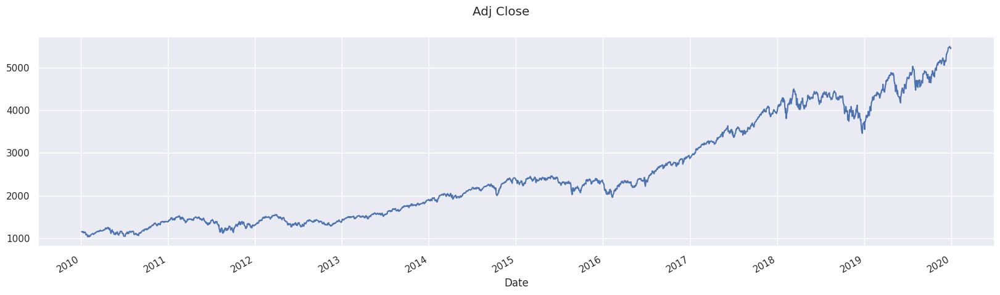

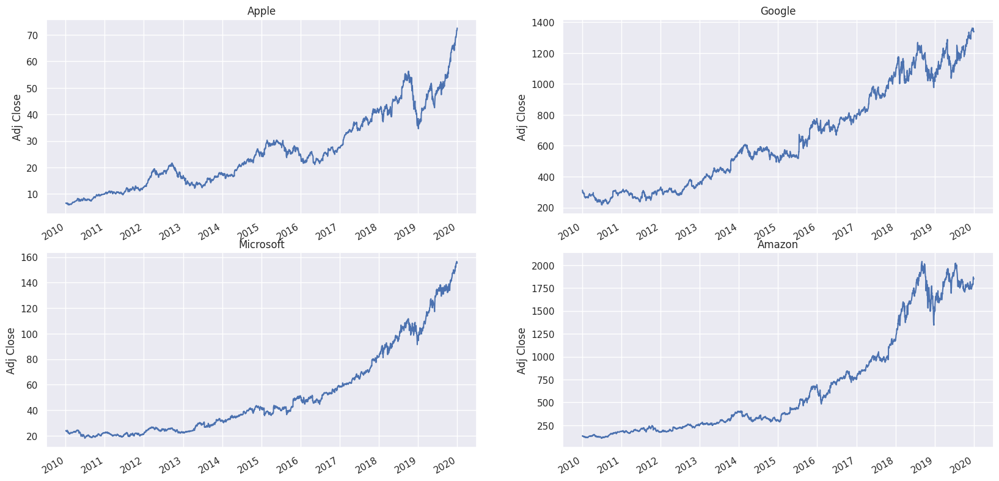

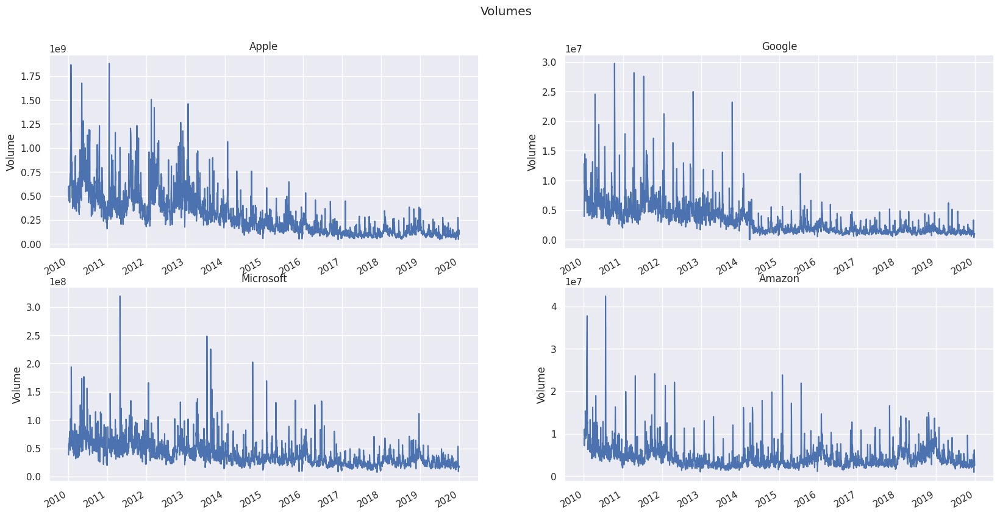

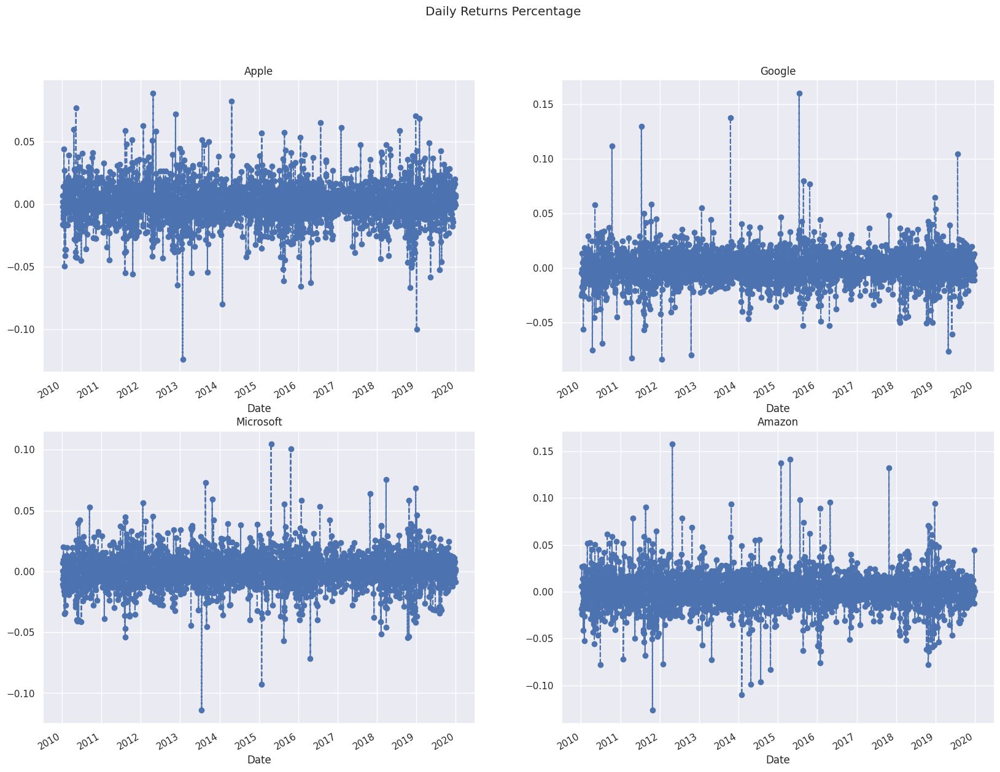

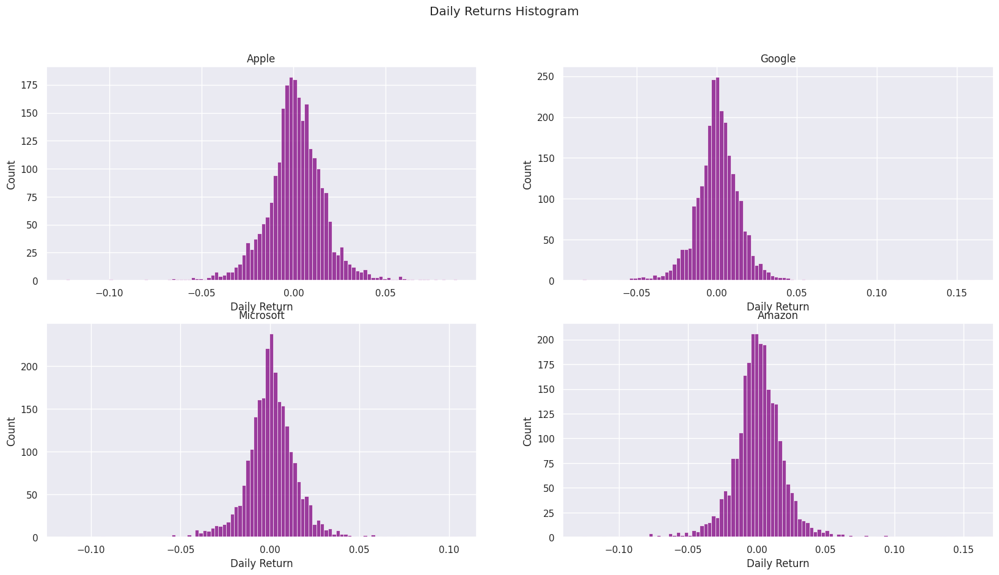

...

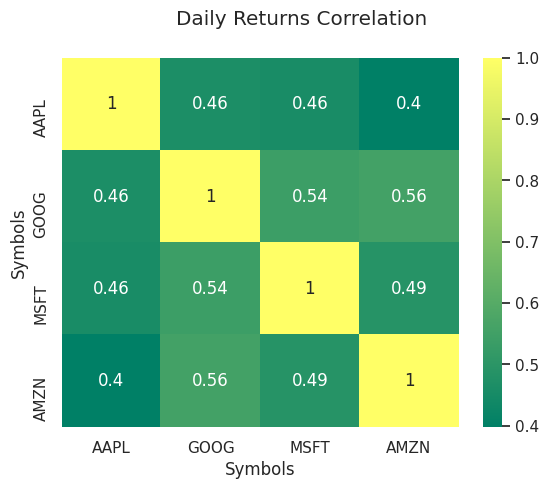

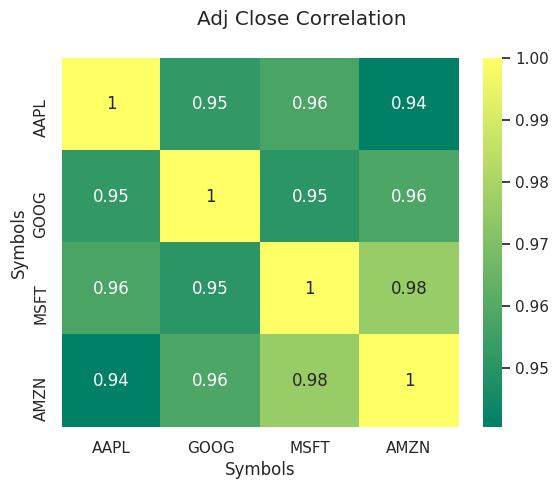

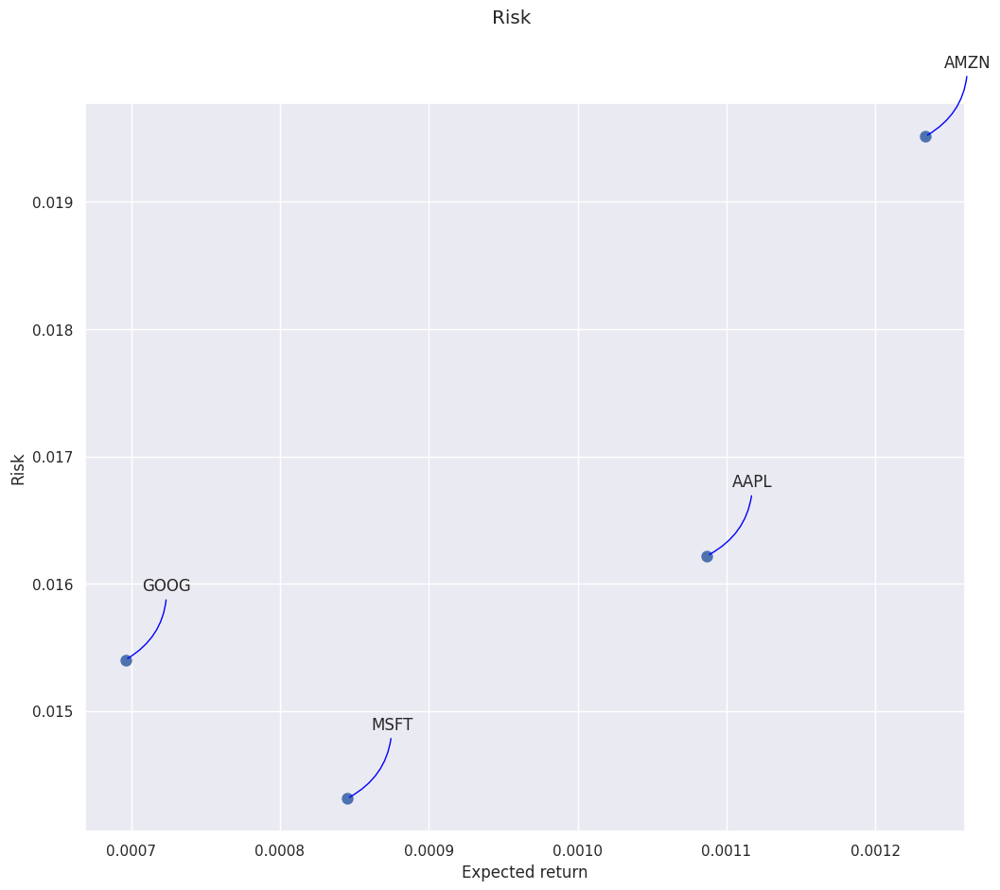

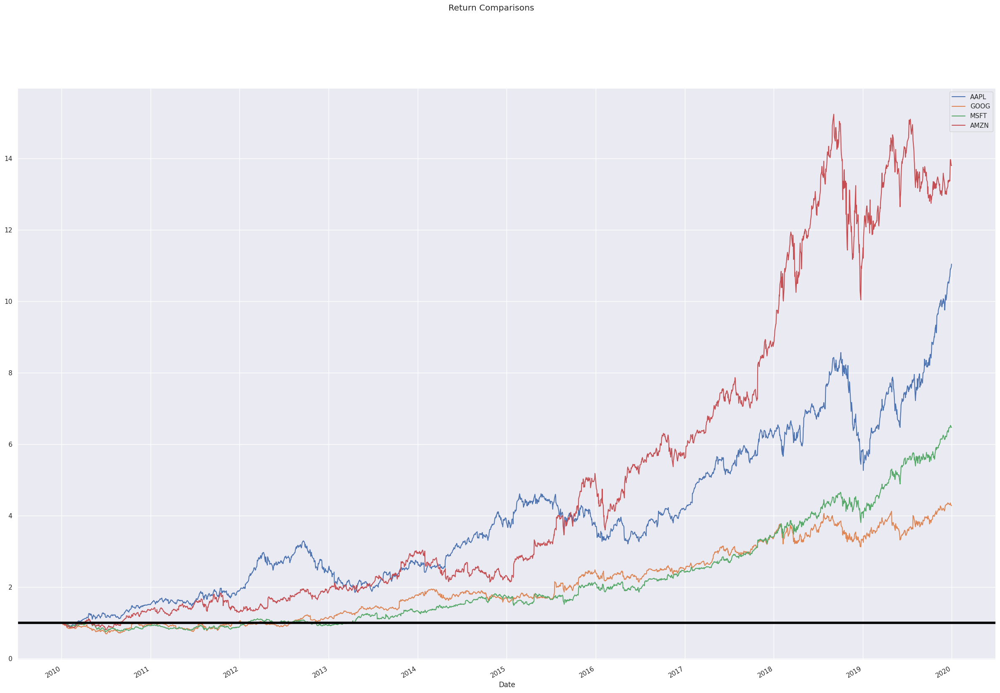

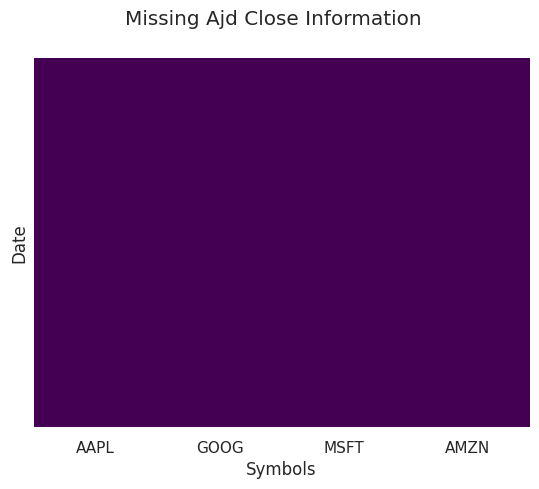

In [244]:
end = datetime(2020, 1, 1)
start = datetime(2010, end.month, end.day)
# Dictionary of stock tickers keyed by company names - High Tech Industry.
high_tech_companies = {'Apple': 'AAPL', 'Google':'GOOG', 'Microsoft':'MSFT', 'Amazon':'AMZN'}
# Main company in high tech for our analysis.
high_tech_main_company = {'Apple': 'AAPL'}
# NASDAQ-100 Technology Sector Index (^NDXT).
display_viz('^NDXT', high_tech_companies, start, end)

## 2.2. Automotive Industry

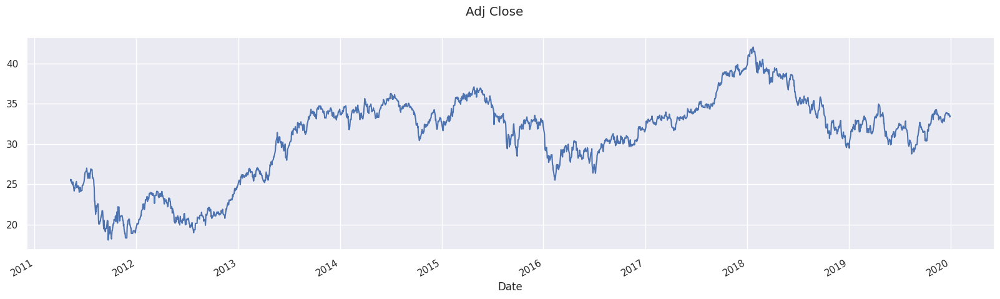

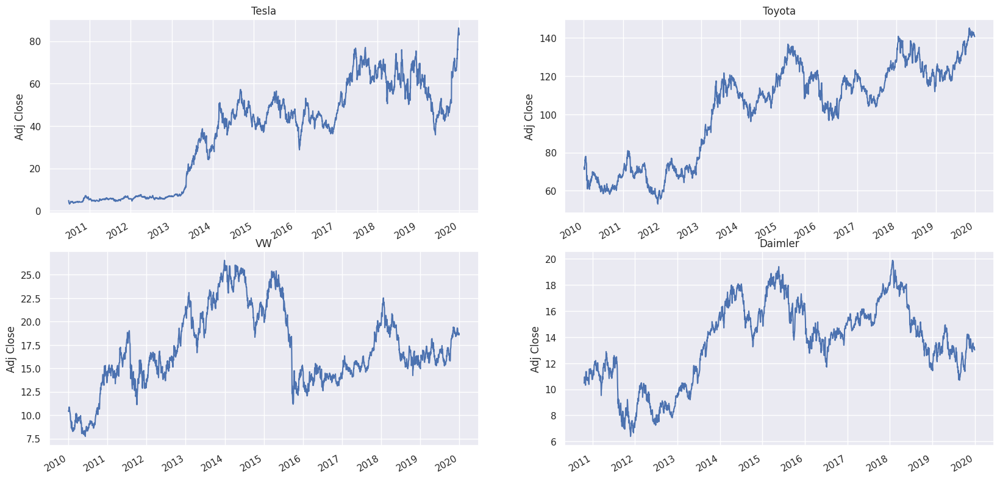

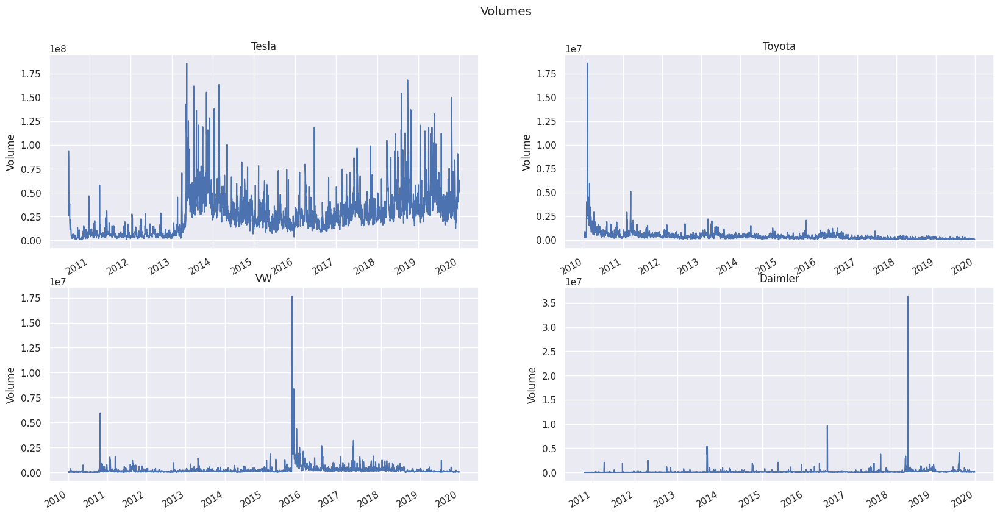

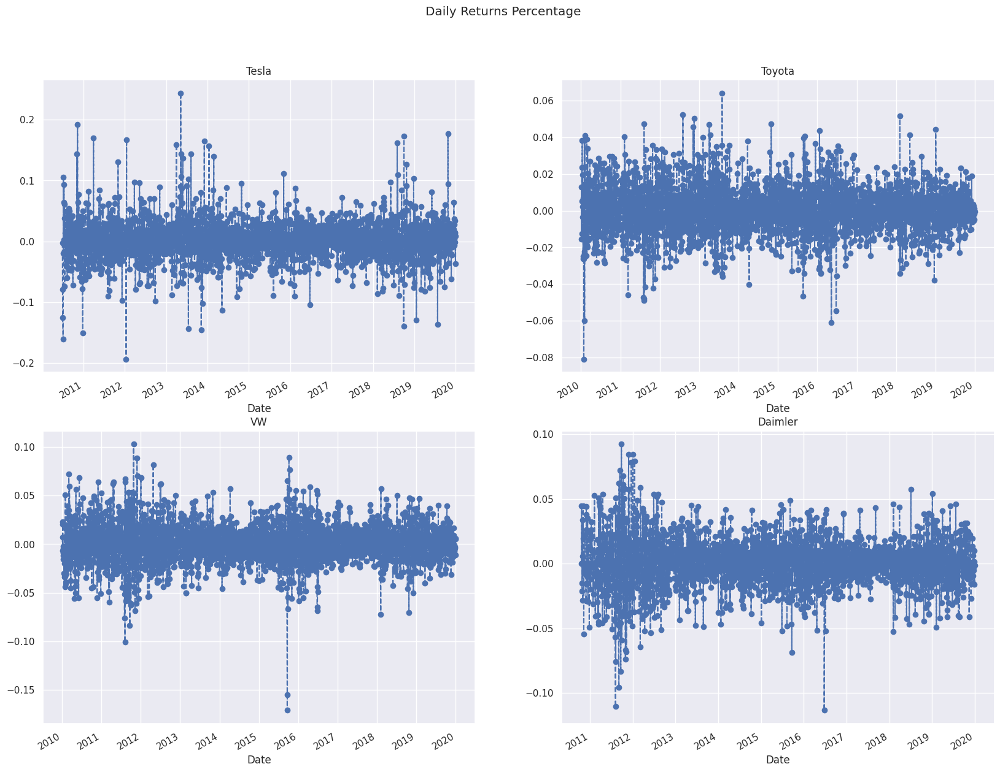

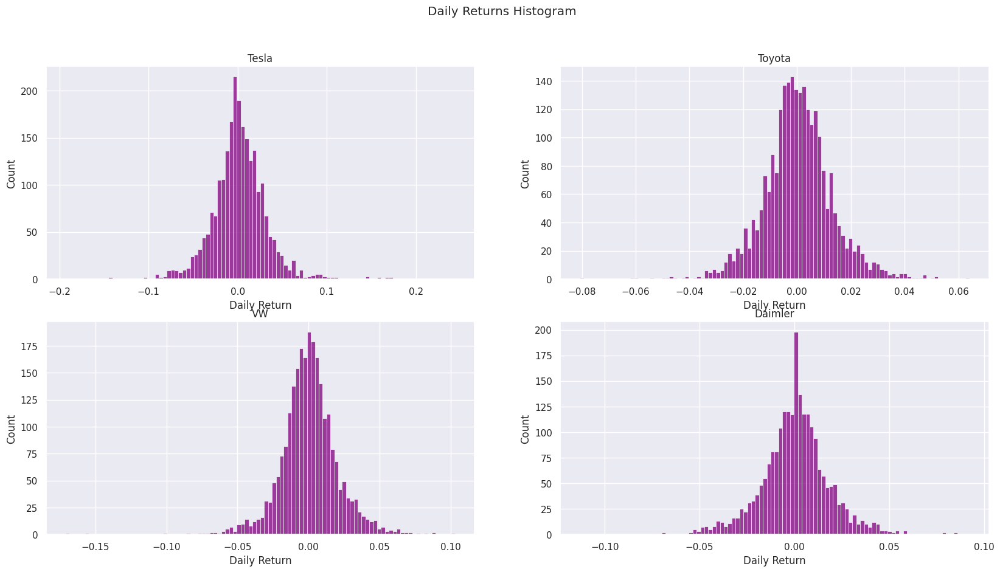

...

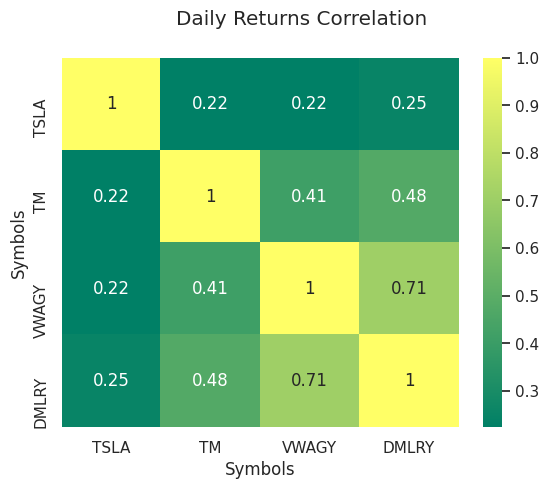

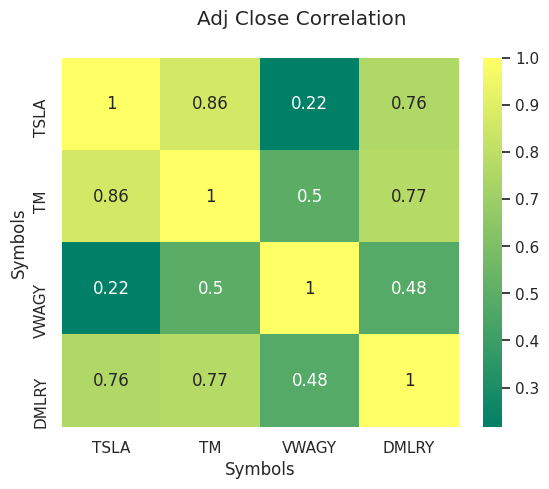

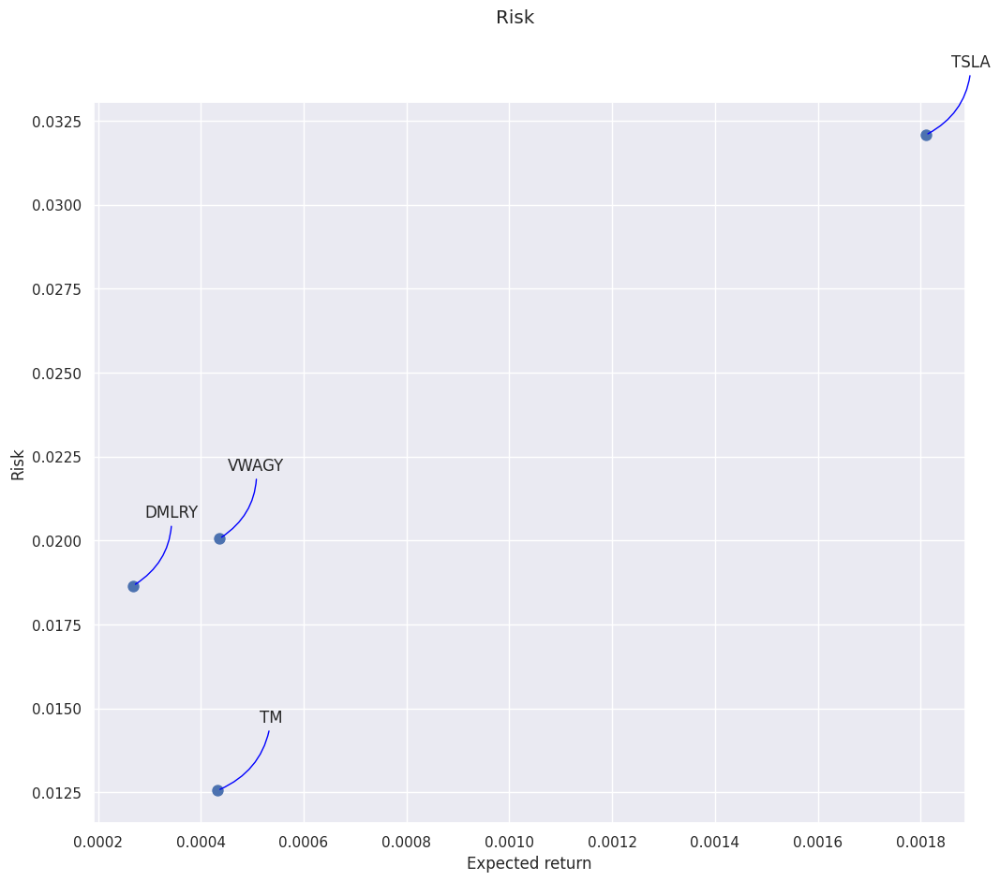

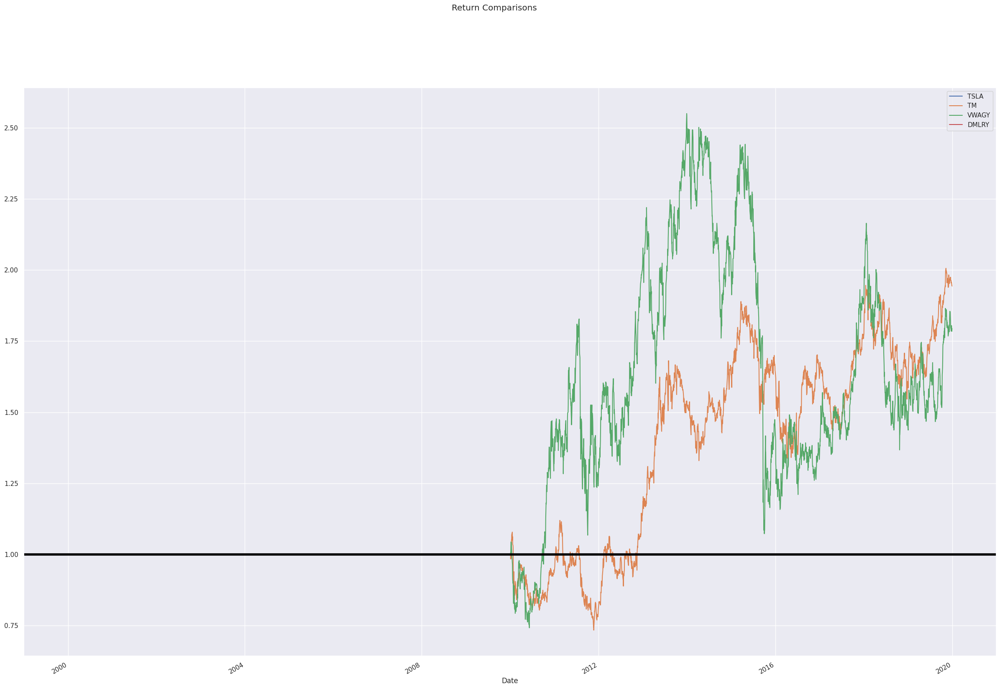

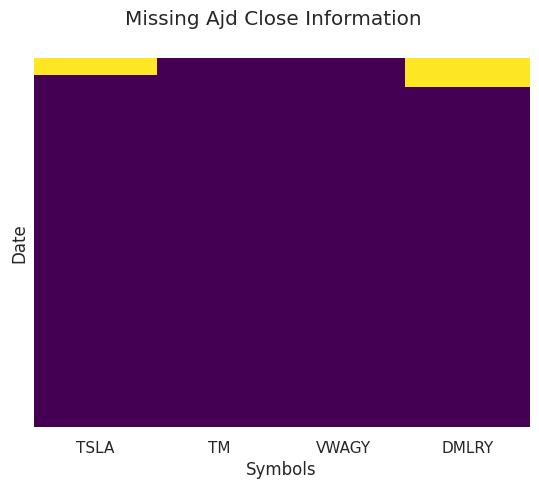

In [245]:
# Dictionary of stock tickers keyed by company names - Automotive Industry.
auto_companies = {'Tesla': 'TSLA', 'Toyota':'TM', 'VW':'VWAGY', 'Daimler':'DMLRY'}
# Main company in automotive for our analysis.
automotive_main_company = {'Tesla': 'TSLA'}
# First Trust NASDAQ Global Auto Index Fund (CARZ).
display_viz('CARZ', auto_companies, start, end)

## 2.3. Technical Indicators

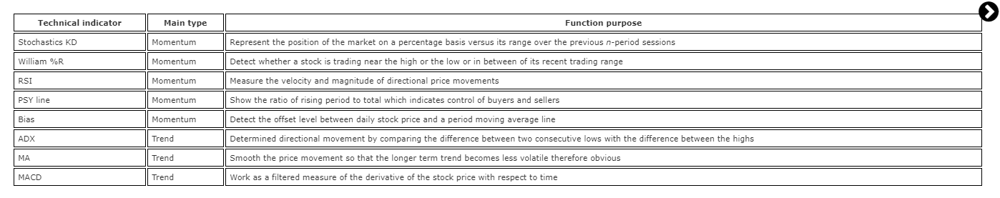

In [246]:
indicators_df = DataReader('AAPL', data_source='yahoo', start='2020-01-01', end='2021-01-01')
indicators_df

,High,Low,Open,Close,Volume,Adj Close
Date,,,,,,
2020-01-02,75.150002,73.797501,74.059998,75.087502,135480400.0,74.207466
2020-01-03,75.144997,74.125000,74.287498,74.357498,146322800.0,73.486023
2020-01-06,74.989998,73.187500,73.447502,74.949997,118387200.0,74.071579
2020-01-07,75.224998,74.370003,74.959999,74.597504,108872000.0,73.723213
2020-01-08,76.110001,74.290001,74.290001,75.797501,132079200.0,74.909149
2020-01-09,77.607498,76.550003,76.809998,77.407501,170108400.0,76.500275
2020-01-10,78.167503,77.062500,77.650002,77.582497,140644800.0,76.673225
2020-01-13,79.267502,77.787498,77.910004,79.239998,121532000.0,78.311295
2020-01-14,79.392502,78.042503,79.175003,78.169998,161954400.0,77.253838


In [247]:
# Moving Averages
# Type: trend
# Purpose: determining if an asset price will continue or if it will reverse a bull or bear trend.

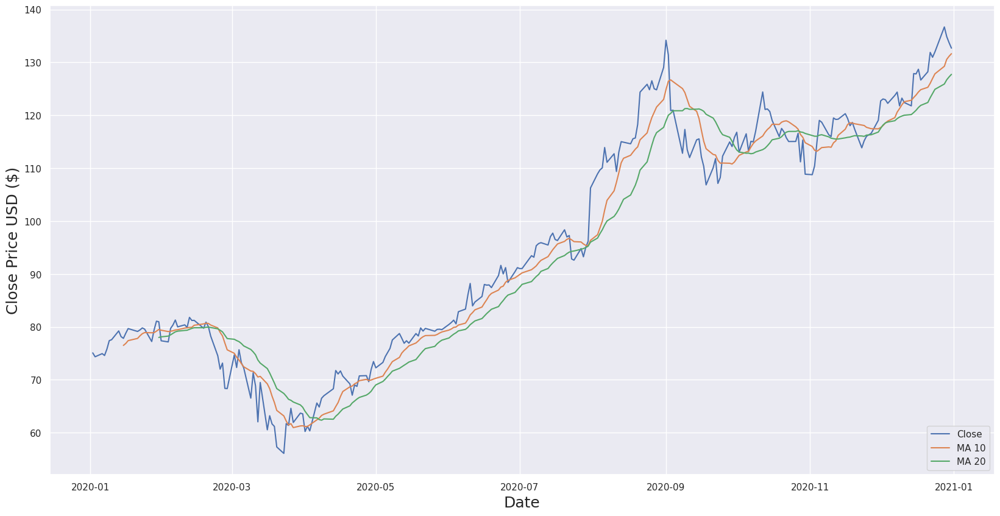

In [248]:
# Set ta to default to an adjusted column, 'adj_close', overriding default 'close'.
indicators_df.ta.adjusted = "adj_close"

indicators_df.ta.sma(length=10, append=True)
indicators_df.ta.sma(length=20, append=True)

# Visualize Adj Close vs Adj Close MA
plt.figure(figsize = (20,10))
plt.xlabel('Date', fontsize=18)
plt.ylabel('Close Price USD ($)', fontsize=18)
plt.plot(indicators_df['close'])
plt.plot(indicators_df['SMA_10'])
plt.plot(indicators_df['SMA_20'])
plt.legend(['Close', 'MA 10', 'MA 20'], loc='lower right')

In [249]:
# Average Directional Index
# Type: trend
# Purpose: to determine the strength of a trend
# Takeaways: reading above 25 means a trend has strength' reading below 20 means the price is trendless.

In [250]:
indicators_df.ta.adx(append=True)     
indicators_df.dropna()

,high,low,open,close,volume,adj_close,SMA_10,SMA_20,ADX_14,DMP_14,DMN_14
date,,,,,,,,,,,
2020-02-11,80.974998,79.677498,80.900002,79.902496,94323200.0,79.153442,79.827000,79.369000,12.246684,28.657624,28.157208
2020-02-12,81.805000,80.367500,80.367500,81.800003,113730400.0,81.033165,79.898500,79.550500,11.738279,29.929257,25.768151
2020-02-13,81.555000,80.837502,81.047501,81.217499,94747600.0,80.456116,79.923500,79.719625,11.299370,28.595668,24.619973
2020-02-14,81.495003,80.712502,81.184998,81.237503,80113600.0,80.475937,80.309500,79.841001,10.794577,27.519604,24.288243
2020-02-18,79.937500,78.652496,78.839996,79.750000,152531200.0,79.002380,80.568000,79.844376,10.886616,24.308783,30.777996
2020-02-19,81.142502,80.000000,80.000000,80.904999,93984000.0,80.146545,80.687250,79.932500,9.949610,28.260387,28.818312
2020-02-20,81.162498,79.552498,80.657501,80.074997,100566000.0,79.324333,80.658499,79.965000,9.459950,26.187206,28.742262
2020-02-21,80.112503,77.625000,79.654999,78.262497,129554000.0,77.528809,80.354499,79.887750,10.292027,23.344579,34.049758
2020-02-24,76.044998,72.307503,74.315002,74.544998,222195200.0,73.846161,79.808249,79.636125,13.229351,18.248417,46.188613


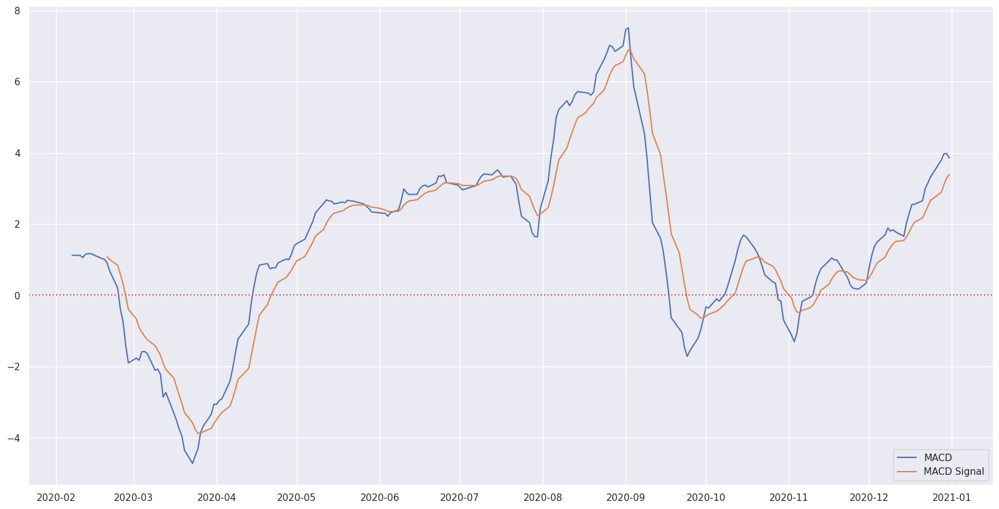

In [251]:
# MACD
# Type: trend-following momentum
# Purpose: detect relationship beween two moving averages
# Takeaways: MACD triggers technical signals when it crosses above (to buy) or below (to sell) its signal line
#            The speed of crossovers is also taken as a signal of a market is overbought or oversold.

# When the MACD falls below the signal line, it is a bearish signal that indicates that it may be time to sell. 
# Conversely, when the MACD rises above the signal line, the indicator gives a bullish signal, 
# which suggests that the price of the asset is likely to experience upward momentum.

indicators_df.ta.macd(append=True)

# Visualize Adj Close vs Adj Close MA
plt.figure(figsize = (20,10))
plt.plot(indicators_df["MACD_12_26_9"])
plt.plot(indicators_df["MACDs_12_26_9"])
plt.axhline(y=0, color='r', linestyle='dotted')
plt.legend(['MACD', 'MACD Signal'], loc='lower right')

In [252]:
# Stochastic Oscillator Signal
# Type: Momentum
# Purpose: to generate overbought or oversold signal and the range is between 0 to 100.
# Takeaways: reading above 80 means overbought; reading below 20 means oversold

# Stochastic oscillator charting generally consists of two lines: one reflecting the actual 
# value of the oscillator for each session, and one reflecting its three-day simple moving average. 
# Because price is thought to follow momentum, the intersection of these two lines is considered to 
# be a signal that a reversal may be in the works, as it indicates a large shift in momentum from day to day.

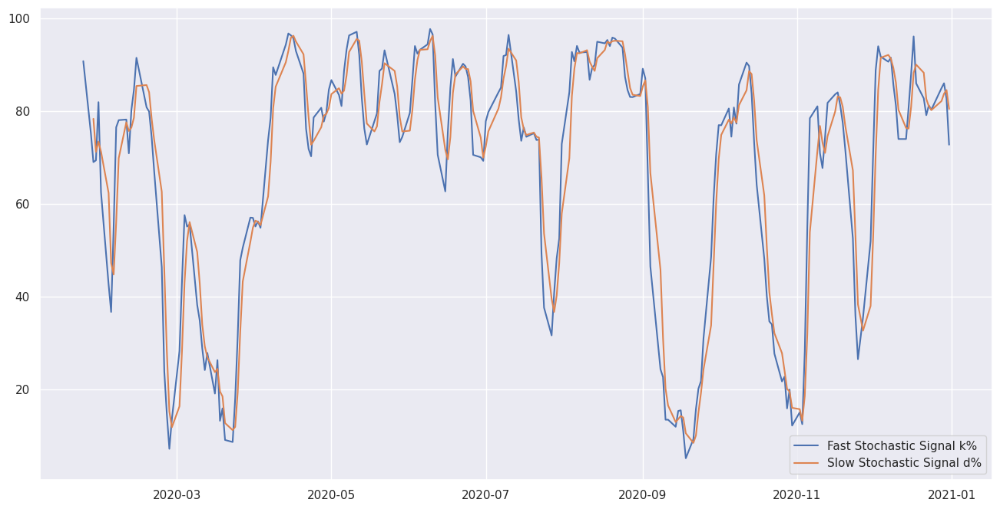

In [253]:
indicators_df.ta.stoch(append=True)

# Visualize Adj Close vs Adj Close MA
plt.figure(figsize=(16,8))
plt.plot(indicators_df["STOCHk_14_3_3"])
plt.plot(indicators_df["STOCHd_14_3_3"])
plt.legend(['Fast Stochastic Signal k%', 'Slow Stochastic Signal d%'], loc='lower right')

In [254]:
# Williams%R
# Type: Momentum
# Purpose: to measure overbought and oversold levels; moves between 0 and -100
# Takeaways:reading above -20 is overbought;reading below is oversold

# Similar to Stochastic Oscillator Signal

In [255]:
indicators_df.ta.willr(append=True)

date
2020-01-02          NaN
2020-01-03          NaN
2020-01-06          NaN
2020-01-07          NaN
2020-01-08          NaN
2020-01-09          NaN
2020-01-10          NaN
2020-01-13          NaN
2020-01-14          NaN
2020-01-15          NaN
2020-01-16          NaN
2020-01-17          NaN
2020-01-21          NaN
2020-01-22    -8.406677
2020-01-23    -2.789940
2020-01-24   -16.415929
2020-01-27   -54.948352
2020-01-28   -21.551348
2020-01-29   -15.280843
2020-01-30   -17.326995
2020-01-31   -79.843254
2020-02-03   -74.873191
2020-02-04   -35.115093
2020-02-05   -24.970709
2020-02-06   -10.300484
2020-02-07   -30.511143
2020-02-10   -24.580636
2020-02-11   -32.149899
2020-02-12    -2.536066
2020-02-13   -11.627040
2020-02-14   -11.314839
2020-02-18   -34.529865
2020-02-19   -14.400024
2020-02-20   -27.680054
2020-02-21   -56.680054
2020-02-24   -76.441211
2020-02-25   -95.254364
2020-02-26   -84.132418
2020-02-27   -98.967937
2020-02-28   -76.019776
2020-03-02   -40.098802
2020-03-03 

In [256]:
# Relative Strenghth Index
# Type: Momentum
# Purpose: measures the magnitude of recent price changes to evaluate overbought or oversold, ranges from 0 to 100
# Takeaways:reading above 70 is overbought;reading below 30 is oversold

In [257]:
indicators_df.ta.rsi(append=True)

date
2020-01-02          NaN
2020-01-03          NaN
2020-01-06          NaN
2020-01-07          NaN
2020-01-08          NaN
2020-01-09          NaN
2020-01-10          NaN
2020-01-13          NaN
2020-01-14          NaN
2020-01-15          NaN
2020-01-16          NaN
2020-01-17          NaN
2020-01-21          NaN
2020-01-22          NaN
2020-01-23    72.508977
2020-01-24    69.890289
2020-01-27    50.075715
2020-01-28    61.151264
2020-01-29    67.126957
2020-01-30    66.350146
2020-01-31    48.053134
2020-02-03    47.223007
2020-02-04    56.847282
2020-02-05    58.906405
2020-02-06    61.748986
2020-02-07    56.001634
2020-02-10    57.258766
2020-02-11    55.095035
2020-02-12    61.262647
2020-02-13    58.601717
2020-02-14    58.668111
2020-02-18    51.990886
2020-02-19    56.162885
2020-02-20    52.623846
2020-02-21    45.831993
2020-02-24    35.664764
2020-02-25    30.685526
2020-02-26    35.100659
2020-02-27    27.270146
2020-02-28    27.215459
2020-03-02    45.825275
2020-03-03 

In [258]:
# Bias
# Definition: irrational belief or thinking what may cause mistaken assumptions based on facts and evidence
# Purpose: to avoid making irrational decisions as much as possible by understanding bias

In [259]:
indicators_df.ta.bias(length=10, append=True)
indicators_df.ta.bias(length=20, append=True)

date
2020-01-02         NaN
2020-01-03         NaN
2020-01-06         NaN
2020-01-07         NaN
2020-01-08         NaN
2020-01-09         NaN
2020-01-10         NaN
2020-01-13         NaN
2020-01-14         NaN
2020-01-15         NaN
2020-01-16         NaN
2020-01-17         NaN
2020-01-21         NaN
2020-01-22         NaN
2020-01-23         NaN
2020-01-24         NaN
2020-01-27         NaN
2020-01-28         NaN
2020-01-29         NaN
2020-01-30    0.037923
2020-01-31   -0.009551
2020-02-03   -0.014042
2020-02-04    0.015418
2020-02-05    0.019953
2020-02-06    0.028291
2020-02-07    0.010252
2020-02-10    0.013255
2020-02-11    0.006722
2020-02-12    0.028278
2020-02-13    0.018789
2020-02-14    0.017491
2020-02-18   -0.001182
2020-02-19    0.012166
2020-02-20    0.001376
2020-02-21   -0.020344
2020-02-24   -0.063930
2020-02-25   -0.092664
2020-02-26   -0.074622
2020-02-27   -0.128106
2020-02-28   -0.121544
2020-03-02   -0.038106
2020-03-03   -0.065747
2020-03-04   -0.019862
2020-0

In [260]:
# Kaufman's Adaptive Moving Average (KAMA)
# Definition: a moving average designed to account for market noise or volatility
# Purpose: adjust when the price swings widen and follow prices from a greater distance. 

In [261]:
indicators_df.ta.kama(append=True)

date
2020-01-02           NaN
2020-01-03           NaN
2020-01-06           NaN
2020-01-07           NaN
2020-01-08           NaN
2020-01-09           NaN
2020-01-10           NaN
2020-01-13           NaN
2020-01-14           NaN
2020-01-15      0.000000
2020-01-16      8.183247
2020-01-17     21.234151
2020-01-21     28.401144
2020-01-22     36.482298
2020-01-23     42.418803
2020-01-24     45.026793
2020-01-27     45.278706
2020-01-28     45.478237
2020-01-29     47.590030
2020-01-30     49.868185
2020-01-31     50.371064
2020-02-03     51.398800
2020-02-04     51.627359
2020-02-05     51.944634
2020-02-06     52.415964
2020-02-07     52.597789
2020-02-10     53.756441
2020-02-11     53.962825
2020-02-12     54.241497
2020-02-13     54.399295
2020-02-14     57.190376
2020-02-18     58.241539
2020-02-19     58.719784
2020-02-20     58.869028
2020-02-21     60.067409
2020-02-24     61.648559
2020-02-25     63.406475
2020-02-26     64.482146
2020-02-27     65.504284
2020-02-28     66.23

# 3. Stock Price Prediction

## 3.1. Moving Average

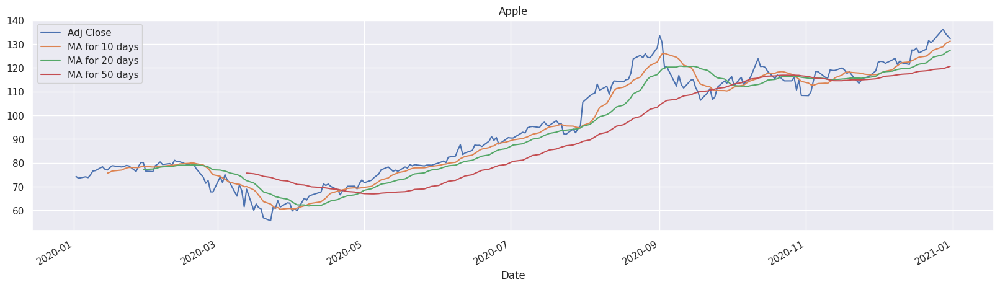

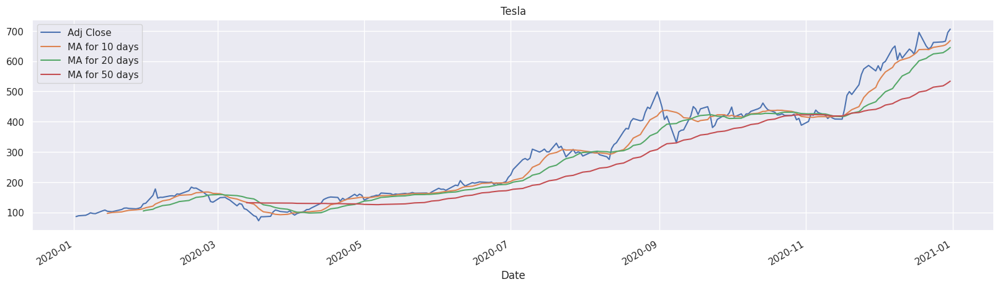

In [262]:
# Calculates moving averages for given company.
# Input is a dictionary with a single company name:stock data pair.
def compute_ma(stock: dict):
    ma_day = [10, 20, 50]
    
    # Extract the first key value pair.
    name, data = next(iter(stock.items()))
    
    for ma in ma_day:
        column_name = f"MA for {ma} days"
        data[column_name] = data['Adj Close'].rolling(ma).mean()

    data[['Adj Close', 'MA for 10 days', 'MA for 20 days', 'MA for 50 days']].plot(figsize=(20,5))
    plt.title(name)
    return data['Adj Close'], data['MA for 10 days']

# High tech
high_tech_main_company_stock = get_stocks(high_tech_main_company, start='2020-01-01', end='2021-01-01')
valid_ma_tech, pred_ma_tech = compute_ma(high_tech_main_company_stock)

# Automotive
automotive_main_company_stock = get_stocks(automotive_main_company, start='2020-01-01', end='2021-01-01')
valid_ma_auto, pred_ma_auto = compute_ma(automotive_main_company_stock)

## 3.2. Adaptive Exponential Smoothing

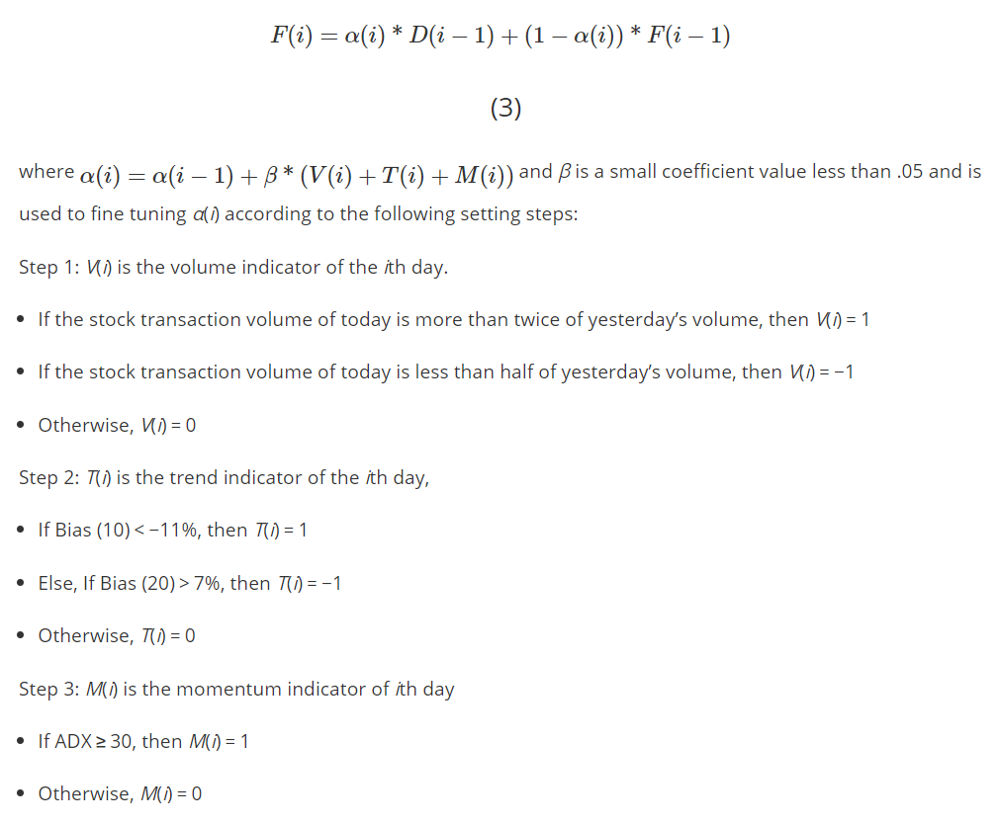

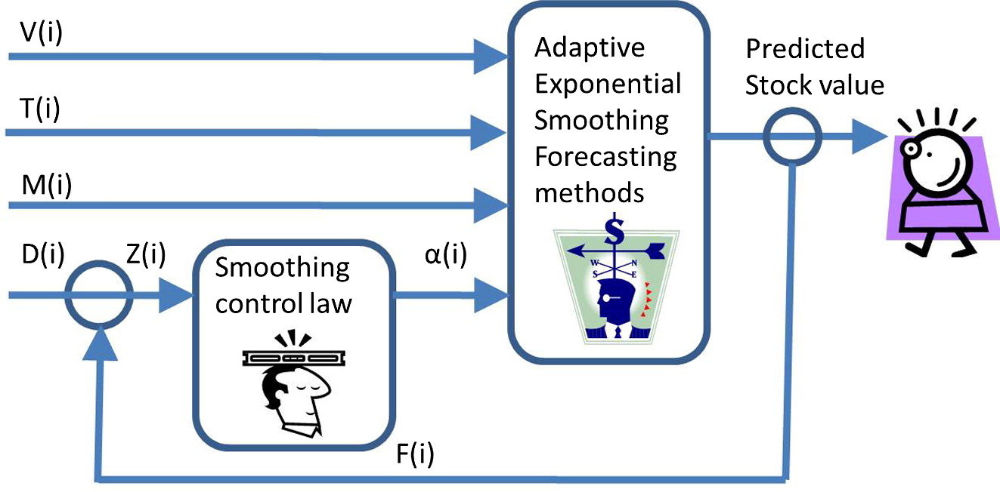

In [263]:
# Calculates adaptive exponential smoothing for given data frame using "Adj Close" column.
# Returns a new series of len(data).
def adaptive_exp_smoothing(data):
     # Create a copy to work with.
    df = data.copy()
    # Calculate the required indicators.
    df.ta.bias(length=10, append=True)
    df.ta.bias(length=20, append=True)
    df.ta.adx(append=True)
    df.ta.kama(append=True)
    # Set previous day forecast to actual closing price at day 0.
    prev_f = df.iloc[0]['adj_close']
    # Set previous day smoothing factor to middle value, 0 <= a <= 1
    prev_a = 0.5
    # Coefficient to tune a, should be less than 0.05.
    b = 0.05
    # Create a column with calculations.
    df['ADP EXP SMOOTH'] = prev_f
    # Calculate for each day.
    for i in range(1, len(df)):
        # Step 1: V(i) is the volume indicator of the ith day.
        v = 0
        if df.iloc[i]['volume'] > (df.iloc[i-1]['volume'] * 2):
            v = 1
        elif df.iloc[i]['volume'] < (df.iloc[i-1]['volume'] / 2):
            v = -1
        else:
            v = 0
            
        # Step 2: T(i) is the trend indicator of the ith day.
        t = 0
        if df.iloc[i]['BIAS_SMA_10'] < -0.11:
            t = 1
        elif df.iloc[i]['BIAS_SMA_20'] > 0.07:
            t = -1
        else:
            t = 0

        # Step 3: M(i) is the momentum indicator of ith day.
        m = 1 if df.iloc[i]['ADX_14'] >= 30 else 0

        # Calculate ith day smoothing factor.
        a = prev_a + b * (v + t + m)
        # Constain a between 0 and 1
        if a > 1.0: a = 1.0
        elif a < 0.0: a = 0
        
        # Previous day actual price.
        prev_d = df.iloc[i-1]['adj_close']
        # Calculate ith day forecast.
        f = a * prev_d + (1 - a) * prev_f
        df['ADP EXP SMOOTH'].iat[i] = f
        
        # Update previus day data.
        prev_a = a
        prev_f = f
    return df['ADP EXP SMOOTH']

# Computes adaptive exponential smoothing for each company and plots the data.
def compute_aes(stocks: dict):
    for name, data in stocks.items():
        data['AES'] = adaptive_exp_smoothing(data)           
        # Visualize the data
        plt.figure(figsize = (20,10))
        plt.xlabel('Date', fontsize=18)
        plt.ylabel('Close Price USD ($)', fontsize=18)
        plt.plot(data['Adj Close'])
        plt.plot(data['AES']) # Adaptive Exponential Smoothing
        plt.legend(['Close', 'AES'], loc='lower right')
        plt.title(name)
        return (data['Adj Close'], data['AES'])

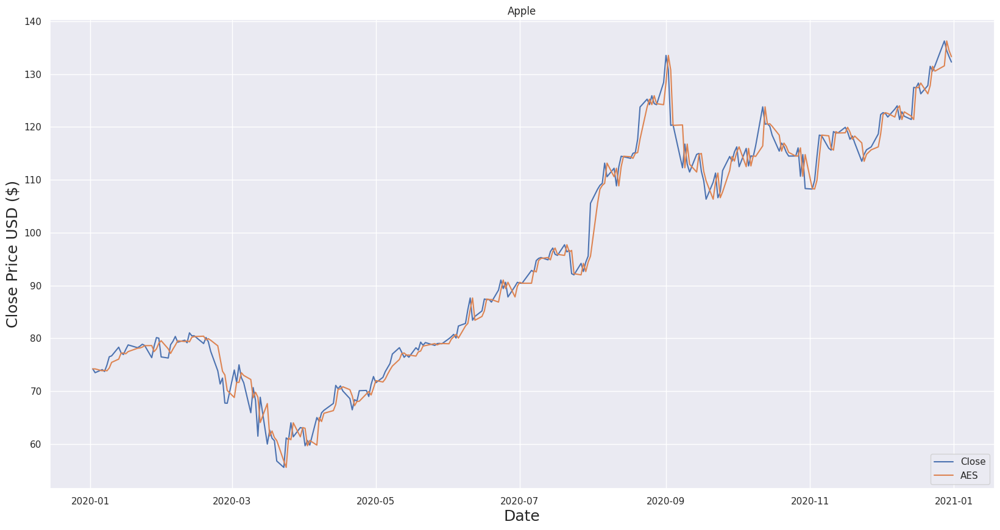

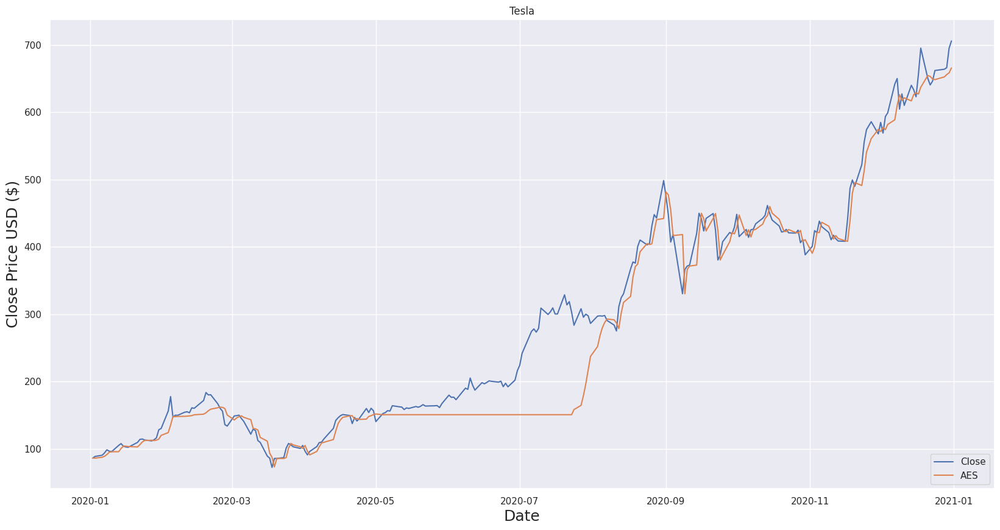

In [264]:
# High tech
valid_aes_tech, pred_aes_tech = compute_aes(high_tech_main_company_stock)

# Automotive
valid_aes_auto, pred_aes_auto = compute_aes(automotive_main_company_stock)

## 3.3. LSTM

In [265]:
# Predicts stock price using LSTM for the given data frame using "Adj Close" column.
# Returns an array of len(period) of predicted prices.
def price_predict_lstm(data, period=30):
     # Convert Adj Close to numpy array
    dataset = data.filter(['Adj Close']).values
    # Get the number of rows to train the model on. Leaving 'period' for prediction.
    training_data_len = len(dataset) - period
  
    # Scale the data.
    scaler = MinMaxScaler(feature_range=(0,1))
    scaled_data = scaler.fit_transform(dataset)

    # Create the training data set.
    train_data = scaled_data[0:int(training_data_len), :]
    # Split the data into x_train and y_train data sets.
    x_train = []
    y_train = []

    for i in range(60, len(train_data)):
        x_train.append(train_data[i-60:i, 0])
        y_train.append(train_data[i, 0])

    # Convert the x_train and y_train to numpy arrays 
    x_train, y_train = np.array(x_train), np.array(y_train)

    # Reshape the data
    x_train = np.reshape(x_train, (x_train.shape[0], x_train.shape[1], 1))
    
    # Build the LSTM model.
    model = Sequential()
    model.add(LSTM(128, return_sequences=True, input_shape=(x_train.shape[1], 1)))
    model.add(LSTM(64, return_sequences=False))
    model.add(Dense(25))
    model.add(Dense(1))

    # Compile the model
    model.compile(optimizer='adam', loss='mean_squared_error')

    # Train the model
    model.fit(x_train, y_train, epochs=10)
    
    # Create the testing data set.
    test_data = scaled_data[training_data_len - 60: , :]
    # Create the data sets x_test and y_test
    x_test = []
    y_test = dataset[training_data_len:, :]
    
    for i in range(60, len(test_data)):
        x_test.append(test_data[i-60:i, 0])

    # Convert the data to a numpy array
    x_test = np.array(x_test)

    # Reshape the data
    x_test = np.reshape(x_test, (x_test.shape[0], x_test.shape[1], 1 ))

    # Get the models predicted price values. 
    predictions = model.predict(x_test)
    predictions = scaler.inverse_transform(predictions)

    # Get the root mean squared error (RMSE).
    rmse = math.sqrt(mean_squared_error(predictions, y_test))
    print(f'Root Mean Squared Error: {rmse}')
    
    return predictions

# Computes LSTM predictions for each company and plots the data.
def compute_lstm(stocks: dict, period=30):
    for name, data in stocks.items():        
        training_data_len = len(data) - period    
        # Plot the data
        train = data[:training_data_len]
        valid = data[training_data_len:]
        predictions = price_predict_lstm(data, period=period)
        valid['Predictions'] = predictions
        # Visualize the data
        plt.figure(figsize = (20,10))
        plt.title('Model')
        plt.xlabel('Date', fontsize=18)
        plt.ylabel('Close Price USD ($)', fontsize=18)
        plt.plot(train['Adj Close'])
        plt.plot(valid[['Adj Close', 'Predictions']])
        plt.legend(['Train', 'Adj Close', 'Predictions'], loc='lower right')
        plt.title(name)
        plt.show()
        # Plot the data (zoom into prediction area)
        # Visualize the data
        plt.figure(figsize = (20,10))
        plt.xlabel('Date', fontsize=18)
        plt.ylabel('Close Price USD ($)', fontsize=18)
        plt.plot(valid[['Adj Close', 'Predictions']])
        plt.legend(['Train', 'Adj Close', 'Predictions'], loc='lower right')
        plt.title(name + ' (Closup)')
        plt.show()
        return (valid['Adj Close'], valid['Predictions'])

Epoch 1/10
84/84 [==============================] - 9s 84ms/step - loss: 0.0072
Epoch 2/10
84/84 [==============================] - 7s 84ms/step - loss: 2.0067e-04
Epoch 3/10
84/84 [==============================] - 7s 82ms/step - loss: 2.0253e-04
Epoch 4/10
84/84 [==============================] - 7s 80ms/step - loss: 2.0747e-04
Epoch 5/10
84/84 [==============================] - 7s 79ms/step - loss: 1.3976e-04
Epoch 6/10
84/84 [==============================] - 7s 78ms/step - loss: 1.6976e-04
Epoch 7/10
84/84 [==============================] - 7s 81ms/step - loss: 1.6981e-04
Epoch 8/10
84/84 [==============================] - 7s 78ms/step - loss: 1.2920e-04
Epoch 9/10
84/84 [==============================] - 7s 77ms/step - loss: 1.6789e-04
Epoch 10/10
84/84 [==============================] - 7s 78ms/step - loss: 1.4408e-04
Root Mean Squared Error: 3.0999287821162578


<ipython-input-265-8572309813f4>:75: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid['Predictions'] = predictions


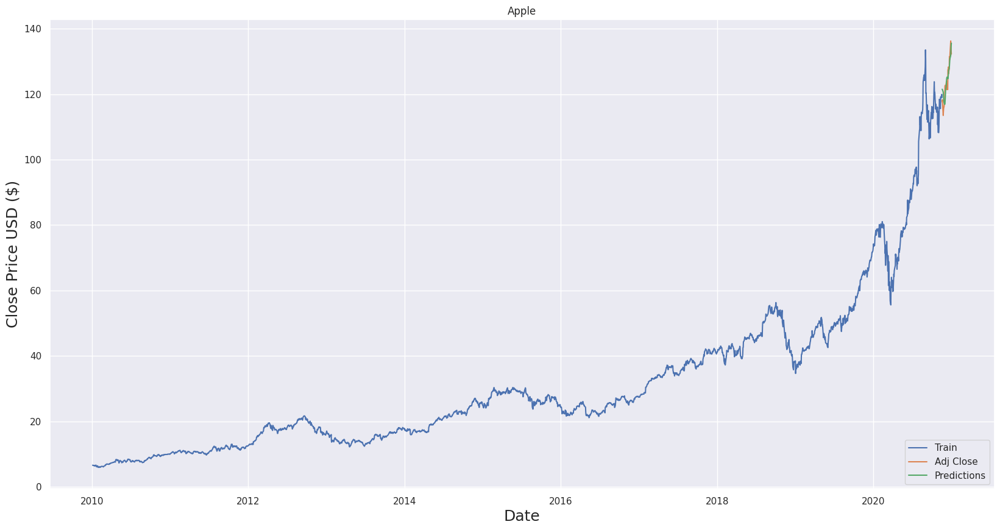

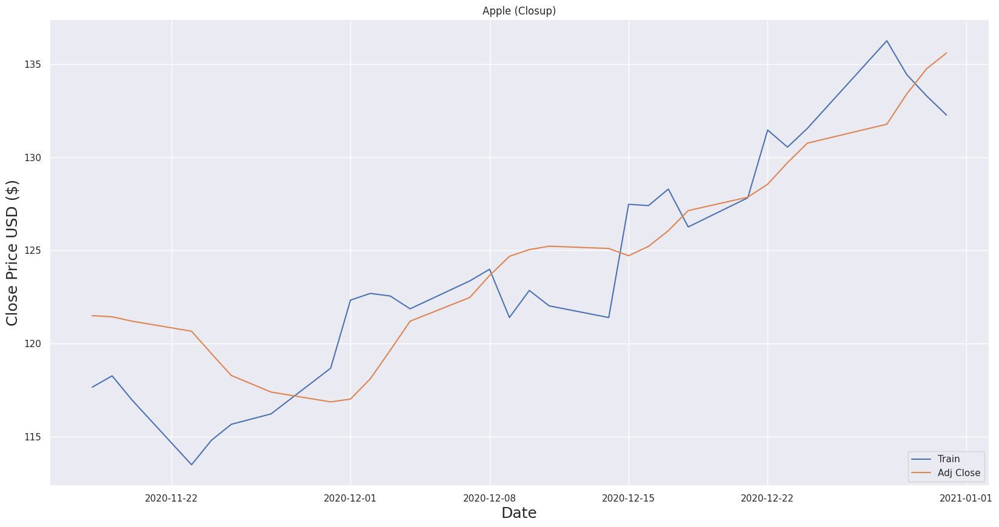

Epoch 1/10
80/80 [==============================] - 8s 78ms/step - loss: 0.0016
Epoch 2/10
80/80 [==============================] - 6s 80ms/step - loss: 2.3069e-04
Epoch 3/10
80/80 [==============================] - 7s 90ms/step - loss: 1.7060e-04
Epoch 4/10
80/80 [==============================] - 7s 90ms/step - loss: 2.1321e-04
Epoch 5/10
80/80 [==============================] - 7s 87ms/step - loss: 1.9102e-04
Epoch 6/10
80/80 [==============================] - 7s 88ms/step - loss: 1.3097e-04
Epoch 7/10
80/80 [==============================] - 6s 78ms/step - loss: 1.4463e-04
Epoch 8/10
80/80 [==============================] - 6s 78ms/step - loss: 1.3756e-04
Epoch 9/10
80/80 [==============================] - 6s 78ms/step - loss: 1.1192e-04
Epoch 10/10
80/80 [==============================] - 6s 77ms/step - loss: 1.4328e-04
Root Mean Squared Error: 30.793045772451183


<ipython-input-265-8572309813f4>:75: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid['Predictions'] = predictions


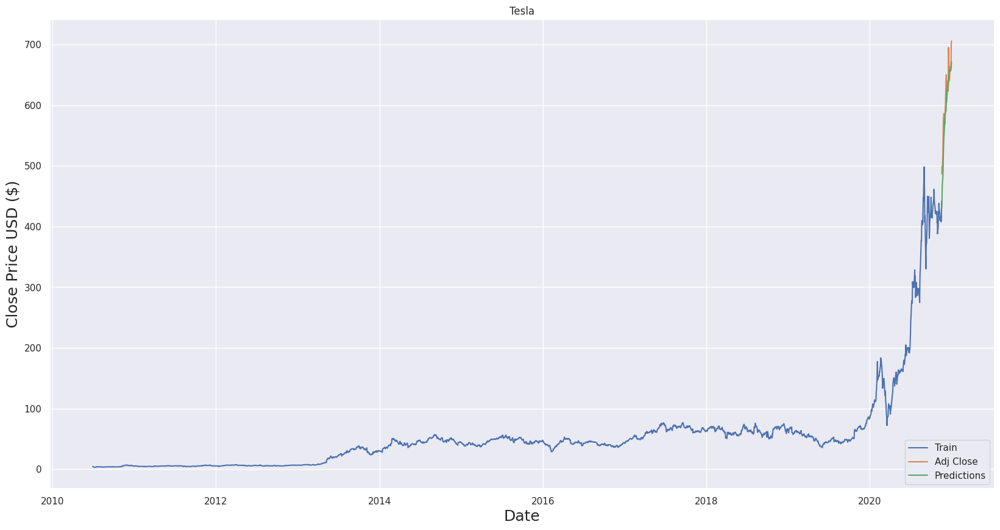

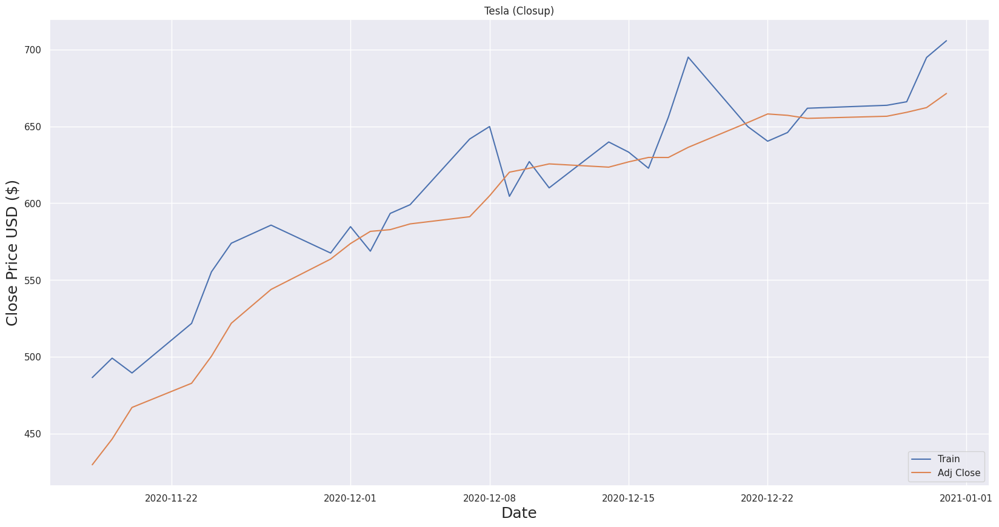

In [266]:
# For ML training based predictions, use larger train window.

# High tech
high_tech_main_company_stock = get_stocks(high_tech_main_company, start='2010-01-01', end='2021-01-01')
valid_lstm_tech, pred_lstm_tech = compute_lstm(high_tech_main_company_stock, period=30)

# Automotive
automotive_main_company_stock = get_stocks(automotive_main_company, start='2010-01-01', end='2021-01-01')
valid_lstm_auto, pred_lstm_auto = compute_lstm(automotive_main_company_stock, period=30)

## 3.4. ARIMA

In [267]:
#Test for staionarity
def test_stationarity(timeseries):
    #Determing rolling statistics
    rolmean = timeseries.rolling(12).mean()
    rolstd = timeseries.rolling(12).std()
    #Plot rolling statistics:
    plt.plot(timeseries, color='blue',label='Original')
    plt.plot(rolmean, color='red', label='Rolling Mean')
    plt.plot(rolstd, color='black', label = 'Rolling Std')
    plt.legend(loc='best')
    plt.title('Rolling Mean and Standard Deviation')
    plt.show(block=False)
    
    print("Results of dickey fuller test")
    adft = adfuller(timeseries,autolag='AIC')
    # output for dft will give us without defining what the values are.
    #hence we manually write what values does it explains using a for loop
    output = pd.Series(adft[0:4],index=['Test Statistics','p-value','No. of lags used','Number of observations used'])
    for key,values in adft[4].items():
        output['critical value (%s)'%key] =  values
    print(output)

def eliminate_stationarity(arima_df):
    # To separate the trend and the seasonality from a time series, 
    # we can decompose the series using the following code.
    result = seasonal_decompose(arima_df['Adj Close'], model='multiplicative', freq = 30)
    fig = plt.figure()  
    fig = result.plot()  
    fig.set_size_inches(16, 9)
    
    # If not stationary then eliminate trend.
    df_log = np.log(arima_df['Close'])
    moving_avg = df_log.rolling(12).mean()
    std_dev = df_log.rolling(12).std()
    plt.figure(figsize=(10, 6))
    plt.legend(loc='best')
    plt.title('Moving Average')
    plt.plot(std_dev, color ="black", label = "Standard Deviation")
    plt.plot(moving_avg, color="red", label = "Mean")
    plt.legend()
    return df_log

def split_train_test(df_log, period=30):
    # Split data into train and training set
    train_data, test_data = df_log[3:int(len(df_log)-period)], df_log[int(len(df_log)-period):]
    plt.figure(figsize=(10,6))
    plt.grid(True)
    plt.xlabel('Dates')
    plt.ylabel('Closing Prices')
    plt.plot(df_log, 'green', label='Train data')
    plt.plot(test_data, 'blue', label='Test data')
    plt.legend()
    return (train_data, test_data)

def find_arima_params(train_data):
    # Find the optimal hyperparams for ARIMA.
    model_autoARIMA = auto_arima(train_data, start_p=0, start_q=0,
                      test='adf',       # use adftest to find optimal 'd'
                      max_p=3, max_q=3, # maximum p and q
                      m=1,              # frequency of series
                      d=None,           # let model determine 'd'
                      seasonal=False,   # No Seasonality
                      start_P=0, 
                      D=0, 
                      trace=True,
                      error_action='ignore',  
                      suppress_warnings=True, 
                      stepwise=True)
    print(model_autoARIMA.summary())
    model_autoARIMA.plot_diagnostics(figsize=(15,8))
    plt.show()

def build_arima_model(train_data, test_data, period=30):
    # Modeling
    # Build Model
    model = ARIMA(train_data, order=(0,1,0))  
    fitted = model.fit(disp=-1)  
    print(fitted.summary())

    # Forecast
    fc, se, conf = fitted.forecast(period, alpha=0.05)  # 95% conf

    # Make as pandas series
    fc_series = pd.Series(fc, index=test_data.index)
    lower_series = pd.Series(conf[:, 0], index=test_data.index)
    upper_series = pd.Series(conf[:, 1], index=test_data.index)
    # Plot
    plt.figure(figsize = (20,10)) 
    plt.plot(train_data, label='training data')
    plt.plot(test_data, color = 'blue', label='Actual Stock Price')
    plt.plot(fc_series, color = 'orange',label='Predicted Stock Price')
    plt.fill_between(lower_series.index, lower_series, upper_series, 
                     color='k', alpha=.10) 
    plt.xlabel('Date', fontsize=18)
    plt.ylabel('Close Price USD ($)', fontsize=18)
    plt.legend(loc='upper left', fontsize=8)
    plt.show()
    # Plot the data (zoom into prediction area)
    # Visualize the data
    plt.figure(figsize = (20,10))   
    plt.xlabel('Date', fontsize=18)
    plt.ylabel('Close Price USD ($)', fontsize=18)
    plt.plot(test_data, color = 'blue', label='Actual Stock Price')
    plt.plot(fc_series, color = 'orange',label='Predicted Stock Price')
    plt.title('Closup')
    plt.show()
    return (test_data, fc)

def compute_arima(stock: dict, period=30):
    for name, data in stock.items():
        test_stationarity(data['Adj Close'])
        df_log = eliminate_stationarity(data)
        train_data, test_data = split_train_test(df_log, period)
        return build_arima_model(train_data, test_data, period)

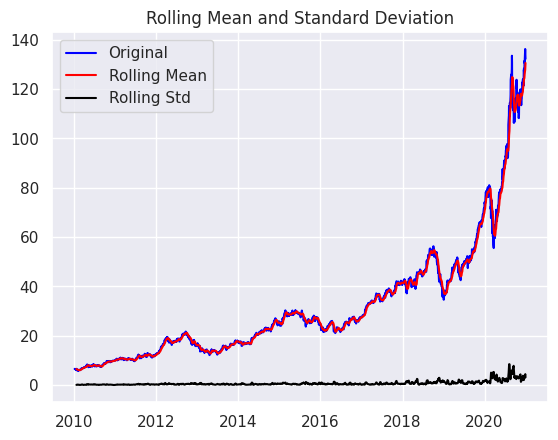

Results of dickey fuller test
Test Statistics                   3.475146
p-value                           1.000000
No. of lags used                 28.000000
Number of observations used    2740.000000
critical value (1%)              -3.432739
critical value (5%)              -2.862595
critical value (10%)             -2.567332
dtype: float64


No handles with labels found to put in legend.
/home/souhib/Projets/SFSU/Stock-Market-Prices/venv/lib/python3.8/site-packages/statsmodels/tsa/base/tsa_model.py:581: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  warnings.warn('A date index has been provided, but it has no'
/home/souhib/Projets/SFSU/Stock-Market-Prices/venv/lib/python3.8/site-packages/statsmodels/tsa/base/tsa_model.py:581: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  warnings.warn('A date index has been provided, but it has no'


                             ARIMA Model Results                              
Dep. Variable:                D.Close   No. Observations:                 2735
Model:                 ARIMA(0, 1, 0)   Log Likelihood                7126.252
Method:                           css   S.D. of innovations              0.018
Date:                Sun, 23 May 2021   AIC                         -14248.505
Time:                        06:15:02   BIC                         -14236.677
Sample:                             1   HQIC                        -14244.230
                                                                              
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.0010      0.000      2.958      0.003       0.000       0.002


<Figure size 640x480 with 0 Axes>

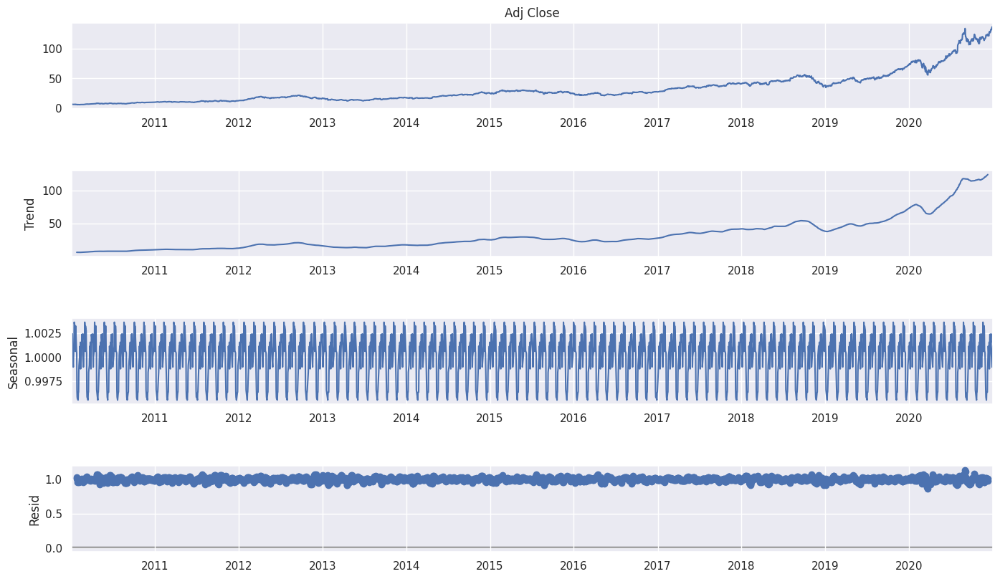

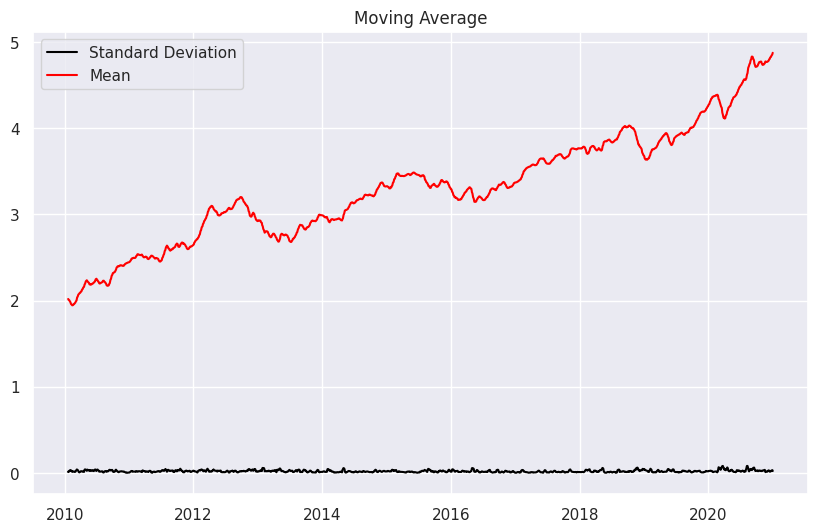

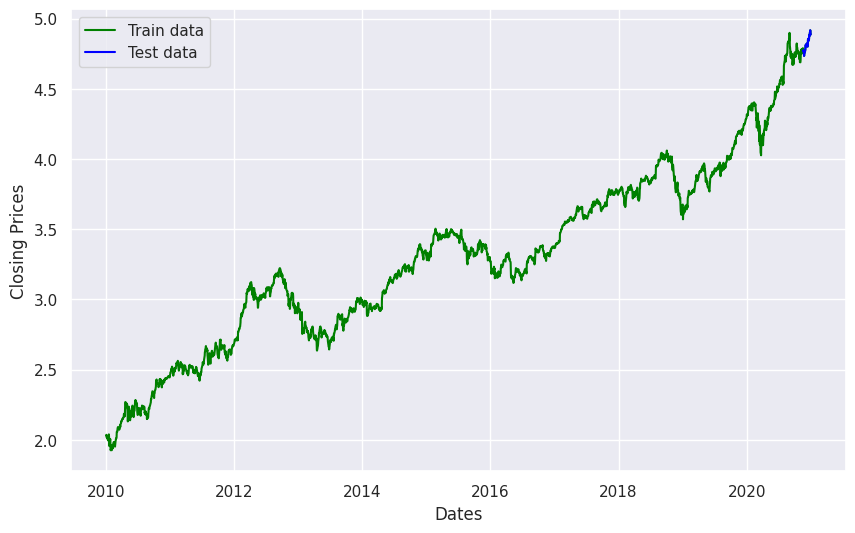

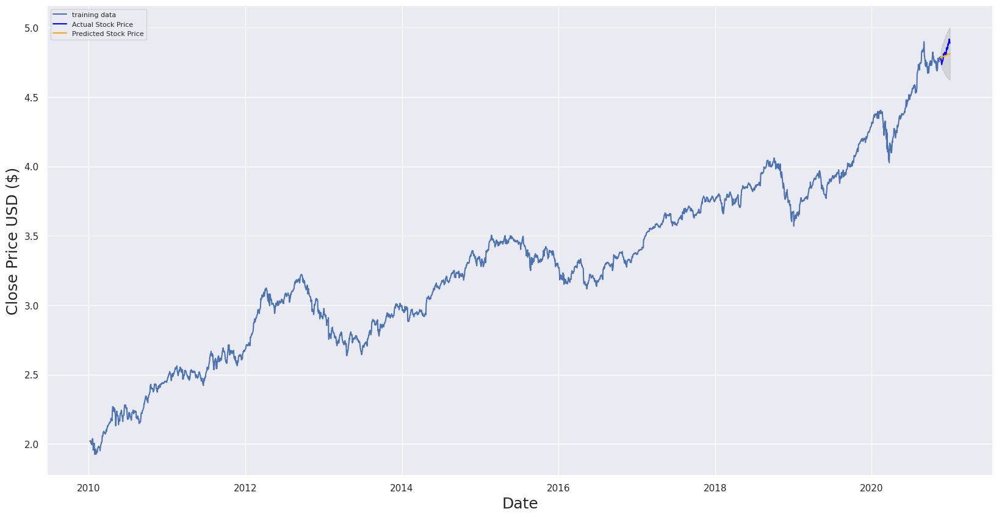

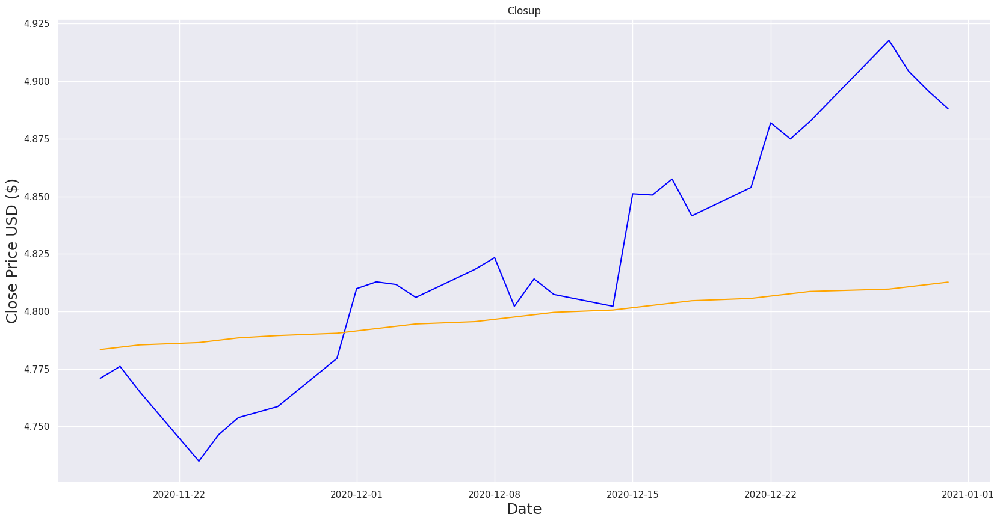

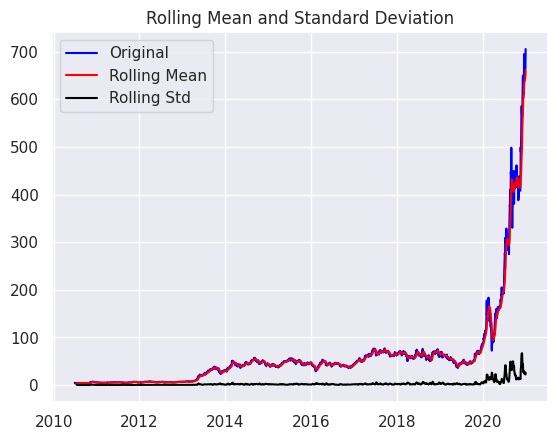

Results of dickey fuller test
Test Statistics                   8.013014
p-value                           1.000000
No. of lags used                 27.000000
Number of observations used    2619.000000
critical value (1%)              -3.432849
critical value (5%)              -2.862644
critical value (10%)             -2.567358
dtype: float64


No handles with labels found to put in legend.


                             ARIMA Model Results                              
Dep. Variable:                D.Close   No. Observations:                 2613
Model:                 ARIMA(0, 1, 0)   Log Likelihood                5042.592
Method:                           css   S.D. of innovations              0.035
Date:                Sun, 23 May 2021   AIC                         -10081.184
Time:                        06:15:06   BIC                         -10069.447
Sample:                             1   HQIC                        -10076.932
                                                                              
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.0018      0.001      2.642      0.008       0.000       0.003


/home/souhib/Projets/SFSU/Stock-Market-Prices/venv/lib/python3.8/site-packages/statsmodels/tsa/base/tsa_model.py:581: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  warnings.warn('A date index has been provided, but it has no'
/home/souhib/Projets/SFSU/Stock-Market-Prices/venv/lib/python3.8/site-packages/statsmodels/tsa/base/tsa_model.py:581: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  warnings.warn('A date index has been provided, but it has no'


<Figure size 640x480 with 0 Axes>

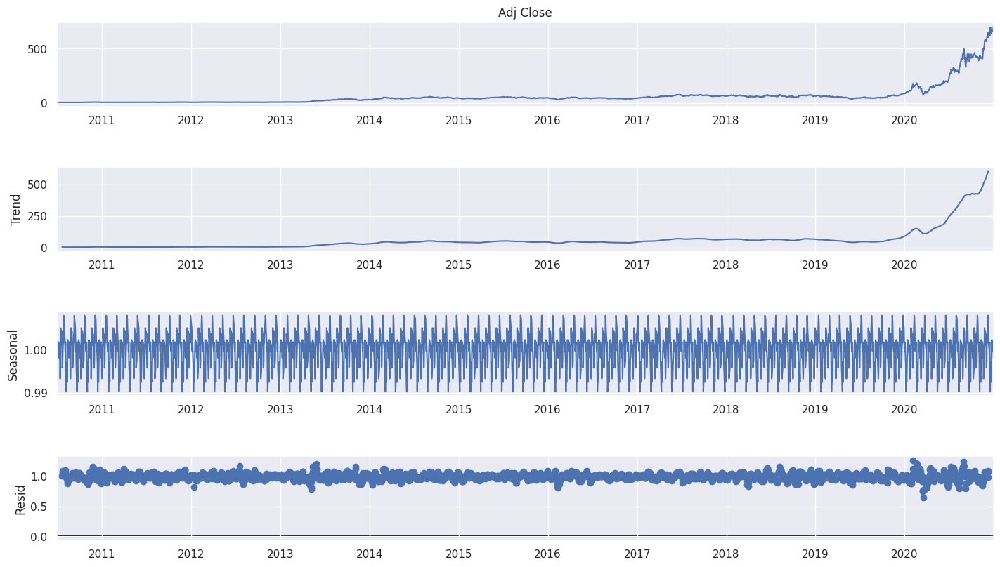

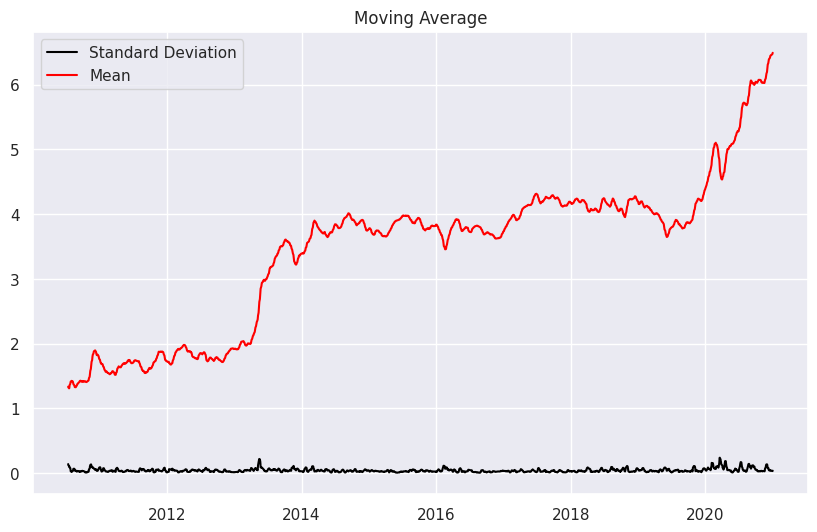

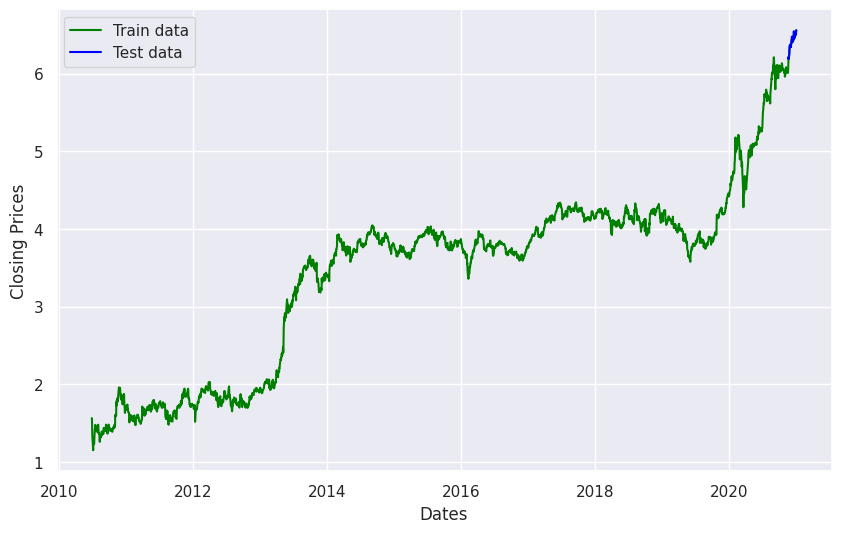

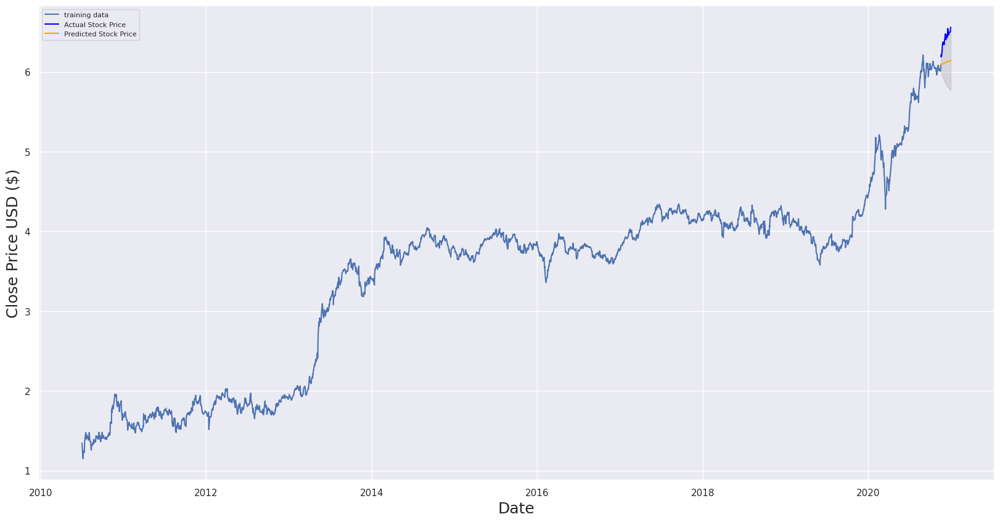

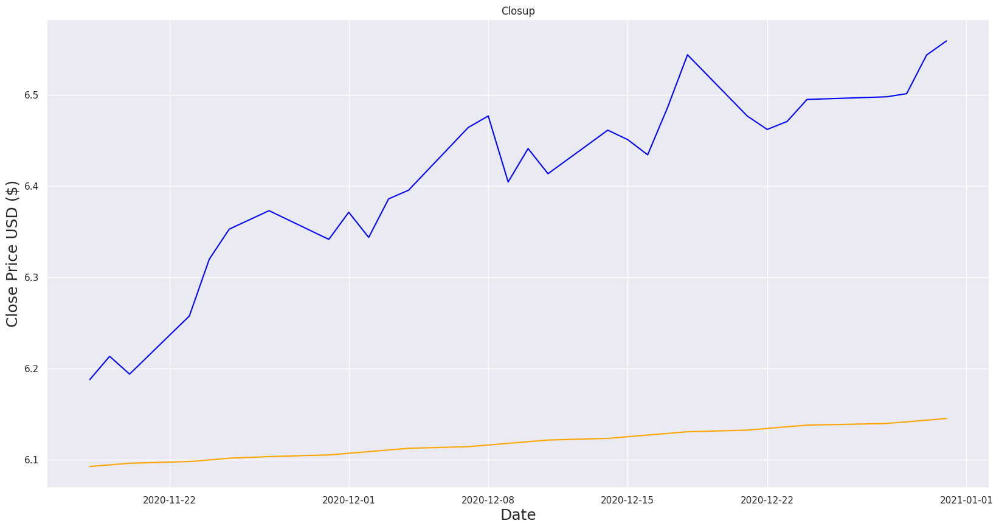

In [268]:
# High tech
valid_arima_tech, pred_arima_tech = compute_arima(high_tech_main_company_stock, period=30)

# Automotive
valid_arima_auto, pred_arima_auto = compute_arima(automotive_main_company_stock, period=30)

## 3.5. Linear Regression

In [269]:
# Predict stock prices for the given company for the next given period.
def linear_Regression_Prediction(stock:dict, period=30):
    
    # Extract the first key value pair.
    name, data = next(iter(stock.items()))    

    df = data[["Adj Close"]]

    # predict price of x future days
    # create a column for this by shifting x days up of Adj Close 
    df["Prediction"] = df[["Adj Close"]].shift(-period)

    # create an array only contains Adj Close column values and drop last x future days
    X = np.array(df.drop(["Prediction"],1))[:-period]
    # create an array only contains Prediction column values and drop last x future days
    Y = np.array(df["Prediction"])[:-period]

    # split the data into 80% training data and 20% testing data, and fit them into the linear regression model
    x_train,x_test,y_train,y_test = train_test_split(X,Y, test_size = 0.35)
    lr = LinearRegression().fit(x_train,y_train)

    # get the last x rows of the feature data set
    x_future = df.drop(["Prediction"],1)[:-period]
    x_future = x_future.tail(period)
    x_future = np.array(x_future)

    # linear regression model prediction
    lr_prediction = lr.predict(x_future)

    # visualize predictions
    predictions = lr_prediction
    valid = df[X.shape[0]:]
    valid["Predictions"] = predictions
    plt.figure(figsize = (20,10))
    plt.title(f" {name} Linear Regression Prediction")
    plt.xlabel("Days")
    plt.ylabel("Adj Close price")
    plt.plot(df["Adj Close"])
    plt.plot(valid[["Adj Close","Predictions"]])
    plt.legend(["Original","Validation","Prediction"])
    plt.show()
    # Plot the data (zoom into prediction area)
    # Visualize the data
    plt.figure(figsize = (20,10))
    plt.xlabel('Date', fontsize=18)
    plt.ylabel('Close Price USD ($)', fontsize=18)
    plt.plot(valid[['Adj Close', 'Predictions']])
    plt.legend(['Train', 'Adj Close', 'Predictions'], loc='lower right')
    plt.title(name + ' (Closup)')
    plt.show()
    return (valid["Adj Close"], valid["Predictions"])

<ipython-input-269-469d9987deda>:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["Prediction"] = df[["Adj Close"]].shift(-period)
<ipython-input-269-469d9987deda>:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid["Predictions"] = predictions


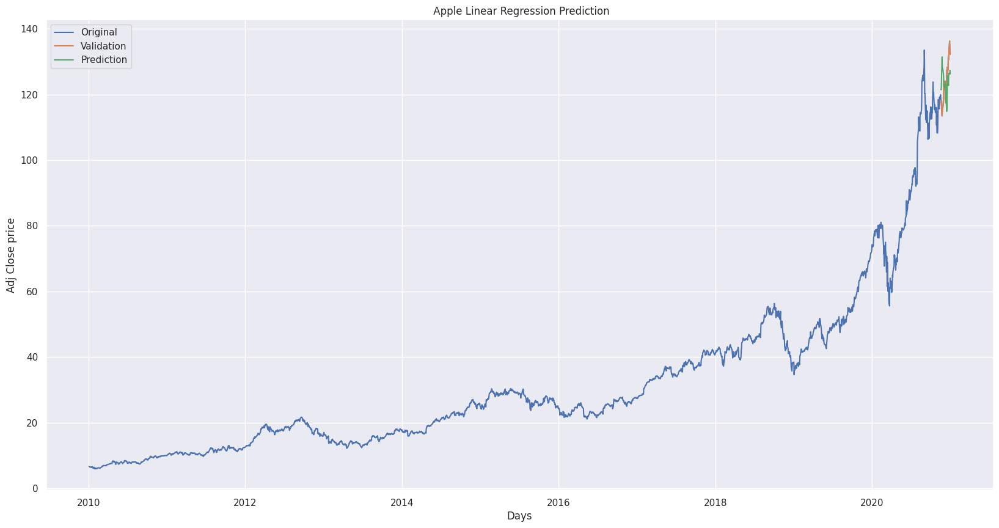

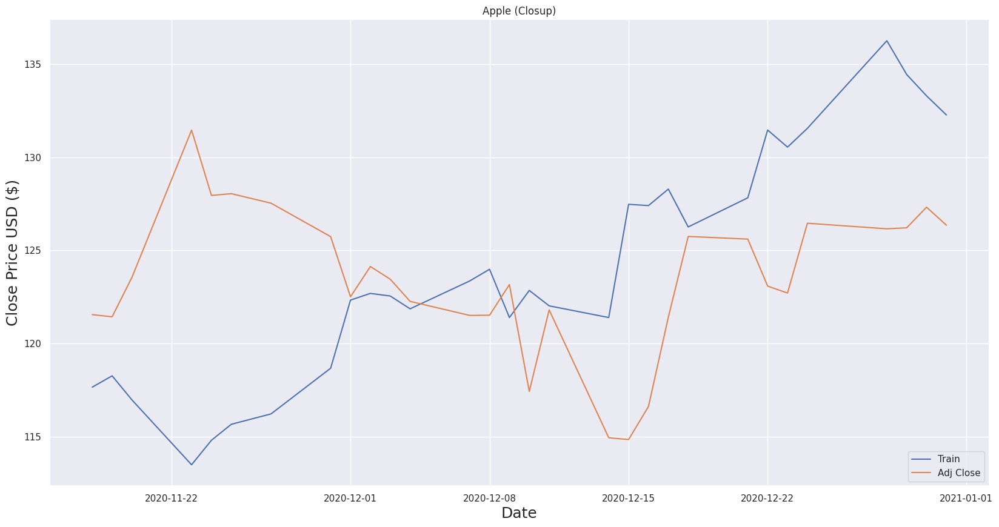

<ipython-input-269-469d9987deda>:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["Prediction"] = df[["Adj Close"]].shift(-period)
<ipython-input-269-469d9987deda>:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid["Predictions"] = predictions


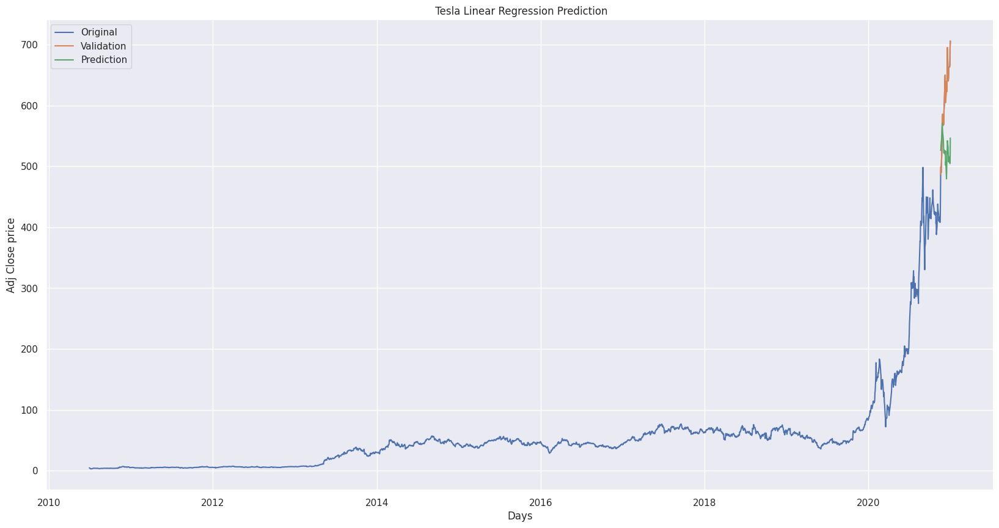

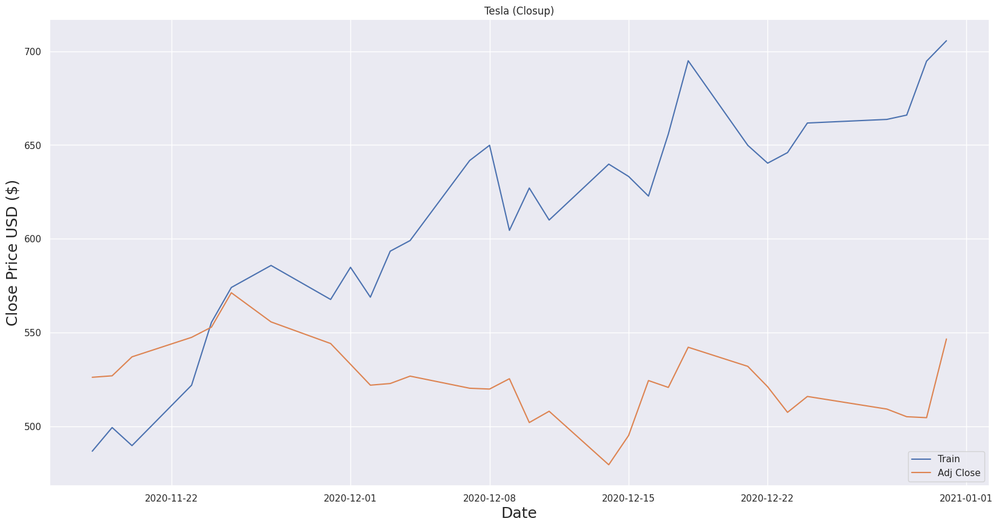

In [270]:
# High tech
valid_linear_regression_tech, pred_linear_regression_tech = linear_Regression_Prediction(high_tech_main_company_stock, period=30)

# Automotive
valid_linear_regression_auto, pred_linear_regression_auto = linear_Regression_Prediction(automotive_main_company_stock, period=30)

## 3.6. Decision Tree

In [271]:
# Predict using decision tree regression.
def decision_Tree_Regressor_Prediction(stock, period=30):
    # Extract the first key value pair.
    name, data = next(iter(stock.items()))  

    df = data[["Adj Close"]]

    # predict price of x future days
    # create a column for this by shifting x days up of Adj Close 
    df["Prediction"] = df[["Adj Close"]].shift(-period)

    # create an array only contains Adj Close column values and drop last x future days
    X = np.array(df.drop(["Prediction"],1))[:-period]
    # create an array only contains Prediction column values and drop last x future days
    Y = np.array(df["Prediction"])[:-period]

    # split the data into 80% training data and 20% testing data, and fit them into the linear regression model
    x_train,x_test,y_train,y_test = train_test_split(X,Y, test_size = 0.2)
    decision_tree = DecisionTreeRegressor().fit(x_train,y_train)

    # get the last x rows of the feature data set
    x_future = df.drop(["Prediction"],1)[:-period]
    x_future = x_future.tail(period)
    x_future = np.array(x_future)

    # decision tree regressor model prediction
    decision_tree_prediction = decision_tree.predict(x_future)

    # visualize predictions
    predictions = decision_tree_prediction
    valid = df[X.shape[0]:]
    valid["Predictions"] = predictions
    plt.figure(figsize = (20,10))
    plt.title(f" {name} Decision Tree Regressor Prediction")
    plt.xlabel("Days")
    plt.ylabel("Adj Close price")
    plt.plot(df["Adj Close"])
    plt.plot(valid["Adj Close"])
    plt.plot(valid["Predictions"], alpha=0.5)
    plt.legend(["Original","Validation","Prediction"])
    plt.show()
    # Plot the data (zoom into prediction area)
    # Visualize the data
    plt.figure(figsize = (20,10))
    plt.xlabel('Date', fontsize=18)
    plt.ylabel('Close Price USD ($)', fontsize=18)
    plt.plot(valid[['Adj Close', 'Predictions']])
    plt.legend(['Train', 'Adj Close', 'Predictions'], loc='lower right')
    plt.title(name + ' (Closup)')
    plt.show()
    return (valid["Adj Close"], valid["Predictions"])

<ipython-input-271-958a8f726355>:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["Prediction"] = df[["Adj Close"]].shift(-period)
<ipython-input-271-958a8f726355>:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid["Predictions"] = predictions


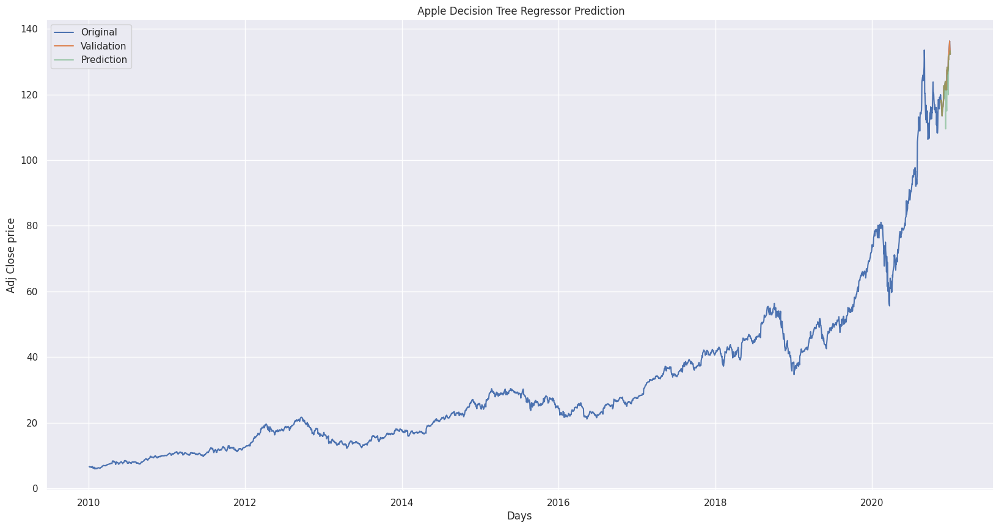

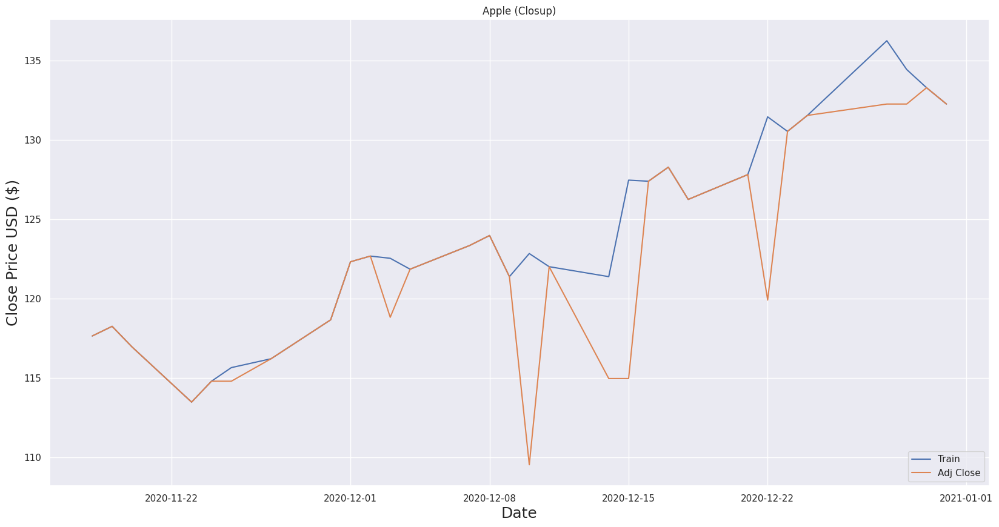

<ipython-input-271-958a8f726355>:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["Prediction"] = df[["Adj Close"]].shift(-period)
<ipython-input-271-958a8f726355>:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid["Predictions"] = predictions


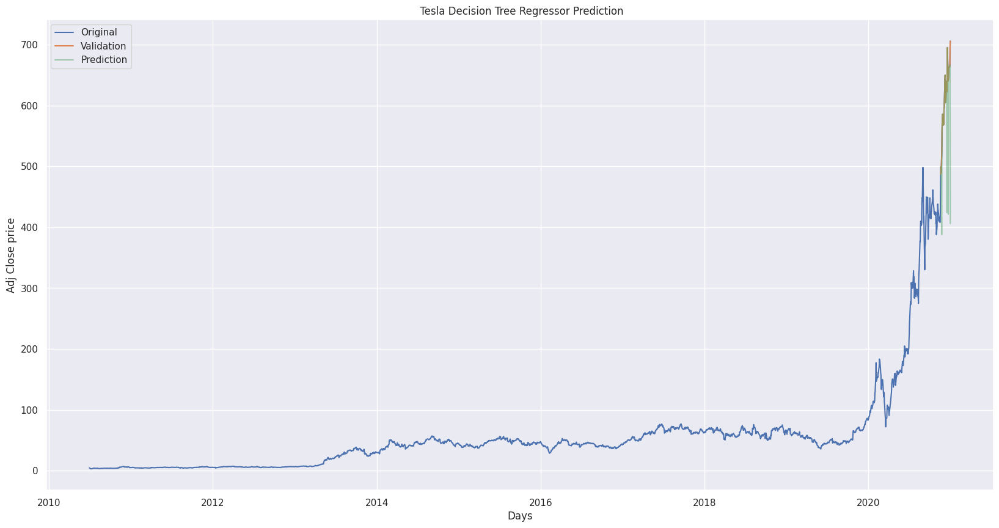

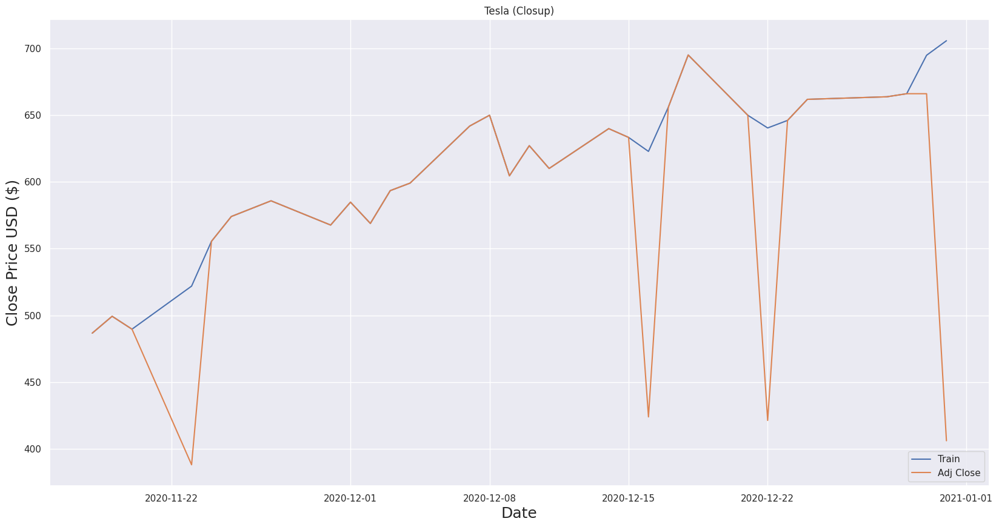

In [272]:
# High tech
valid_decision_tree_tech, pred_decision_tree_tech = decision_Tree_Regressor_Prediction(high_tech_main_company_stock, period=30)

# Automotive
valid_decision_tree_auto, pred_decision_tree_auto = decision_Tree_Regressor_Prediction(automotive_main_company_stock, period=30)

## 3.7. Facebook Prophet

In [273]:
# Predict using Facebook Prophet.
def fb_prophet_predictions(data, period=30):
    # Need to give a dataset with DATE and Y column
    # to get the DATE column we need to reset the index of the dataframe
    # the Y column is the Adj Close of the dataframe
    # Name is really important and the dataframe NEED to have DATE column and Y column
    df = data["Adj Close"].reset_index().rename(columns={"Adj Close": "y", "Date": "ds"})
    m = Prophet()
    m.fit(df)
    future = m.make_future_dataframe(periods=period)
    forecast = m.predict(future)
    return forecast

def compute_fb_prophet_predictions(stock, period=30):
    # Extract the first key value pair.
    name, data = next(iter(stock.items()))
    df = data.filter(items=['Adj Close'])
    # NOTE: Passing large train data appears to be making it less accurate.
    df = df.tail(500)
    train = df.head(len(df) - period)
    train
    
    predictions = fb_prophet_predictions(train, period)
    predictions = predictions.set_index('ds').tail(period)['yhat']
    
    # Visualize the data
    plt.figure(figsize = (20,10))
    plt.xlabel('Date', fontsize=18)
    plt.ylabel('Close Price USD ($)', fontsize=18)
    plt.plot(df['Adj Close'].tail(period))
    plt.plot(predictions) 
    plt.legend(['Close', 'Forecast'], loc='lower right')
    plt.title(name + ' (Closup)')
    plt.show()
    return (df['Adj Close'].tail(period), predictions)

INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


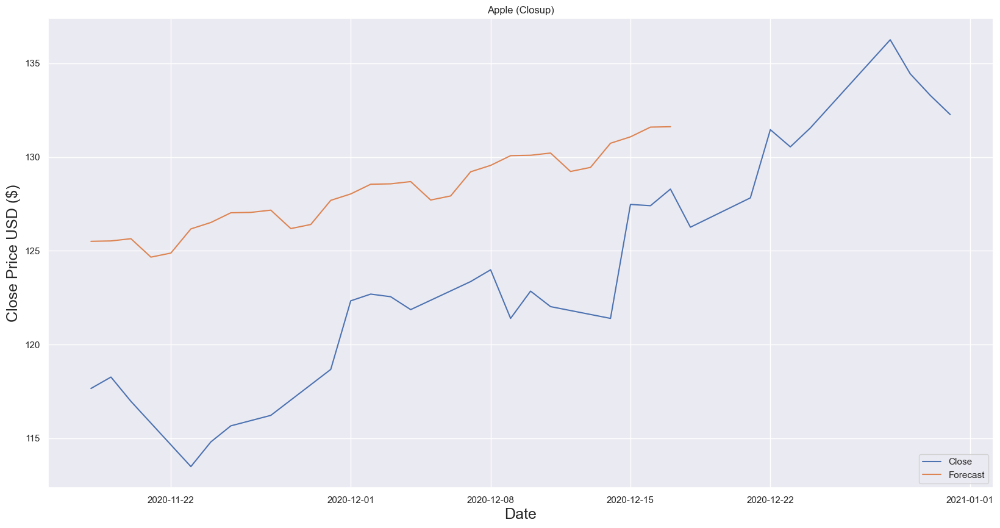

INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


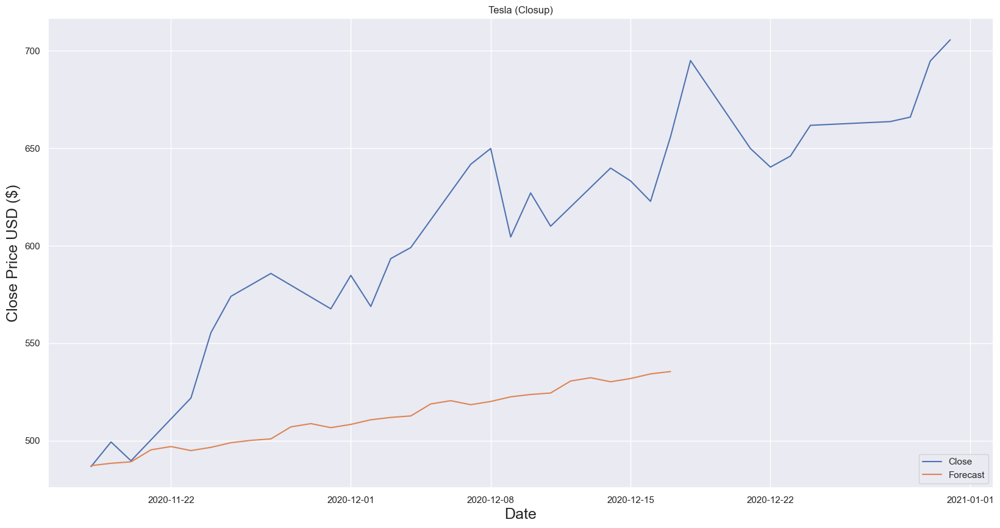

In [33]:
# High tech
valid_fb_prophet_tech, pred_fb_prophet_tech = compute_fb_prophet_predictions(high_tech_main_company_stock, period=30)

# Automotive
valid_fb_prophet_auto, pred_fb_prophet_auto = compute_fb_prophet_predictions(automotive_main_company_stock, period=30)

## 3.7. Predictor Evaluation

In [274]:
def compute_MSE(valid, predictions):
    print("MSE : ", mean_squared_error(valid, predictions))

def compute_MAE(valid, predictions):
    print("MAE : ", mean_absolute_error(valid, predictions))

def compute_RMSE(valid, predictions):
    print("RMSE : ", mean_squared_error(valid, predictions, squared=False))

def compute_MAPE(valid, predictions):
    print("MAPE : ", np.mean(np.abs(predictions - valid)/np.abs(valid)))

def evaluate_model(valid, predictions):
    compute_MSE(valid, predictions)
    compute_MAE(valid, predictions)
    compute_RMSE(valid, predictions)
    compute_MAPE(valid, predictions)

### 3.7.1. Tech Industry

#### 3.7.1.1. Moving Average

In [275]:
# Use the last 30 predictions for evaluation among all algorithms.
period=30
evaluate_model(valid_ma_tech.tail(30), pred_ma_tech.tail(30))

MSE :  12.139615637872604
MAE :  2.9500903828938805
RMSE :  3.484195120522472
MAPE :  0.023461825131152487


#### 3.7.1.2. Adaptive Exponential Smoothing

In [276]:
evaluate_model(valid_aes_tech.tail(period), pred_aes_tech.tail(period))

MSE :  4.618907974545921
MAE :  1.6427497863769531
RMSE :  2.1491644828969982
MAPE :  0.013164789213674675


#### 3.7.1.3. LSTM

In [277]:
evaluate_model(valid_lstm_tech.tail(period), pred_lstm_tech.tail(period))

MSE :  9.609558454192786
MAE :  2.623321278889974
RMSE :  3.0999287821162578
MAPE :  0.021458209864114428


#### 3.7.1.4. Arima

In [278]:
evaluate_model(valid_arima_tech.tail(period), pred_lstm_tech.tail(period))

MSE :  14344.312606261252
MAE :  119.6556243417858
RMSE :  119.76774443171773
MAPE :  24.802020814865884


#### 3.7.1.5. Linear Regression

In [279]:
evaluate_model(valid_linear_regression_tech.tail(period), pred_linear_regression_tech.tail(period))

MSE :  56.96059567642067
MAE :  6.039796619110813
RMSE :  7.5472243690260505
MAPE :  0.0490546735085166


#### 3.7.1.6. Decision Tree

In [280]:
evaluate_model(valid_decision_tree_tech.tail(period), pred_decision_tree_tech.tail(period))

MSE :  18.09746701392578
MAE :  1.816779581705729
RMSE :  4.254111777319183
MAPE :  0.014341148644107675


#### 3.7.1.7. Facebook Prophet

In [41]:
evaluate_model(valid_fb_prophet_tech.tail(period), pred_fb_prophet_tech.tail(period))

MSE :  35.30753838009583
MAE :  5.043642749653583
RMSE :  5.942014673500548
MAPE :  0.06371973332018234


### 3.7.2. Auto Industry

#### 3.7.2.1. Moving Average

In [281]:
evaluate_model(valid_ma_auto.tail(30), pred_ma_auto.tail(30))

MSE :  2215.48130891161
MAE :  38.34573394775392
RMSE :  47.06889959316672
MAPE :  0.06564337486790298


#### 3.7.2.2. Adaptive Exponential Smoothing

In [282]:
evaluate_model(valid_aes_auto.tail(period), pred_aes_auto.tail(period))

MSE :  726.5848437989873
MAE :  22.120338112204667
RMSE :  26.955237780420102
MAPE :  0.03646257636941416


#### 3.7.2.3. LSTM

In [283]:
evaluate_model(valid_lstm_auto.tail(period), pred_lstm_auto.tail(period))

MSE :  948.2116679442736
MAE :  24.500808715820312
RMSE :  30.793045772451183
MAPE :  0.041446815474550765


#### 3.7.2.4. Arima

In [284]:
evaluate_model(valid_arima_auto.tail(period), pred_lstm_auto.tail(period))

MSE :  347678.37134519365
MAE :  585.7387558552443
RMSE :  589.6425793183474
MAPE :  91.236704173729


#### 3.7.2.5. Linear Regression

In [285]:
evaluate_model(valid_linear_regression_auto.tail(period), pred_linear_regression_auto.tail(period))

MSE :  12066.153005663964
MAE :  95.68134056924553
RMSE :  109.84604228493608
MAPE :  0.15041657321677732


#### 3.7.2.6. Decision Tree

In [286]:
evaluate_model(valid_decision_tree_auto.tail(period), pred_decision_tree_auto.tail(period))

MSE :  6535.647781831988
MAE :  29.340001424153645
RMSE :  80.84335335593143
MAPE :  0.046131544394391905


#### 3.7.2.7. Facebook Prophet

In [48]:
evaluate_model(valid_fb_prophet_auto.tail(period), pred_fb_prophet_auto.tail(period))

MSE :  11902.115351991793
MAE :  99.29783050970123
RMSE :  109.09681641547472
MAPE :  0.12238644566234765


# 4. Stock Signal Generation

## 4.1. Class Labeling Strategies

### 4.1.1. Daily Percentage Change

In [287]:
# Calculates class label for individual rows of data based on Adj Close percentage change from the previous period.
def _calc_row_label_pct_change(row, threshhold):
    label = 0
    # Rule 1: As the stock value increases and the up value is over the stock transaction tax, the target value is identified as “Buy,” labeled as “1”.
    if row > threshhold:
        label = 1
    # Rule 2: “Sell,” labeled as “−1” if the stock value decreases and the down value is more than the stock transaction tax.
    elif row < 0 and abs(row) > threshhold:
        label = 2
    # Rule 3: If not in the cases of the above, the target value is identified as “Hold,” labeled as “0”
    else:
        label = 0
    return label

# Creates hold (0), buy (1), sell (2) labels based on Adj Close percentage change from the previous period that exceeds given threshhold.
# Input should contain Adj Close values of the company.
# Returns a new series of len(data).
def create_labels_pct_change(data, threshhold=0.005):
    # Create a copy to work with.
    df = data['Adj Close']
    # Calculate value differences from previous rows.
    # Calculate class labels for each row.
    df['CLASS'] = df.pct_change(periods=1).apply(lambda row: _calc_row_label_pct_change(row, threshhold))
    return df['CLASS']

### 4.1.2. Moving Average Crossover

In [288]:
# Creates hold (0), buy (1), sell (2) labels based on Adj Close cross-over with MA with given window.
# Input should contain Adj Close values of the company.
# Returns a new series of len(data).
def create_labels_ma_crossover(data, window=10):
    # Determine points where Adj Close is above MA as boolean -> int.
    x = (data['Adj Close'] > data['Adj Close'].rolling(window).mean()).astype(int)
    y = x.diff()
    y[y==-1] = 2
    return y

### 4.1.3. Local Peaks

In [289]:
# Creates hold (0), buy (1), sell (2) labels based on local peaks/dips with given distance.
# Input should contain Adj Close values of the company.
# Returns a new series of len(data).
def create_labels_peaks(data, distance=10):
    # Create a copy to work with.
    df = data['Adj Close']
    # Find peaks
    peaks, _ = find_peaks(df, distance=distance)
    local_max = df[peaks].tolist()
    # Find dips
    inverted = -1 * df
    dips, _ = find_peaks(inverted, distance=distance)
    local_min = (inverted[dips] * -1).tolist()
    # Create labels
    labels = []
    for i in df:
        if i in local_max:
            labels.append(2) # Sell if at max point
        elif i in local_min:
            labels.append(1) # Buy if low point
        elif i not in local_max or i not in local_min:
            labels.append(0) # Hold
    return pd.Series(labels, df.index)

## 4.2. Top-Down Approach with LSTM

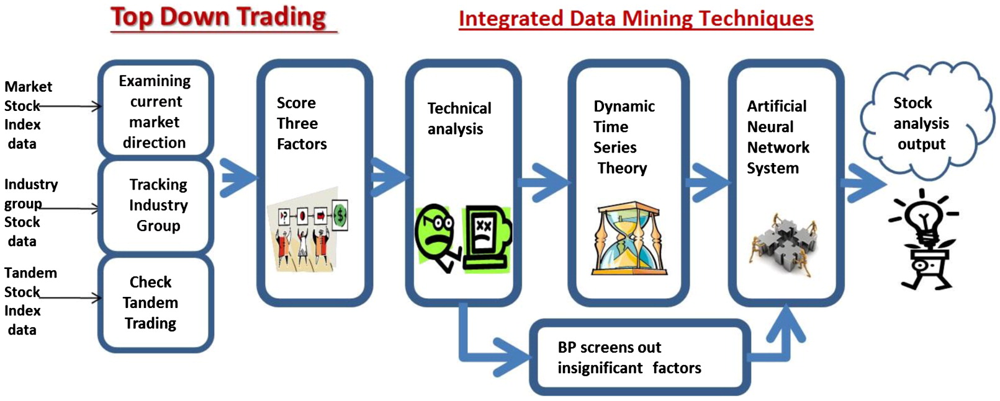

### Top Down Scores

The first step is to survey and to establish the current market direction and to investigate if the current line of least resistance is positive, negative, or neutral (Livermore, 1940). It is essential to make sure the least resistance lines are in the direction of the investor’s trade before entering the trade.

In [290]:
# Calculates top down scores for individual rows of data.
def _calc_row_top_down_scores(row, company_symbol, market_symbol, industry_symbol, sister_symbol):
    company = row[company_symbol]
    market = row[market_symbol]
    industry = row[industry_symbol]
    sister = row[sister_symbol]
    score = 0
    # Rule 1: If the TSI and individual stock value are the same (upward, downward, or flat), the score is 1 and −1 otherwise.
    if ((market < 0 and company < 0) or (market > 0 and company > 0) or (market == 0 and company == 0)):
        score += 1
    else:
        score += -1
        
    # Rule 2: If the industry group and individual stock value are the same (upward, downward, or flat), the score is 1 and −1 otherwise.
    if ((industry < 0 and company < 0) or (industry > 0 and company > 0) or (industry == 0 and company == 0)):
        score += 1
    else:
        score += -1

    # Rule 3: If the tandem stock and individual stock value are the same (upward, downward, or flat), the score is 1 and −1 otherwise.
    if ((sister < 0 and company < 0) or (sister > 0 and company > 0) or (sister == 0 and company == 0)):
        score += 1
    else:
        score += -1

    # Rule 4: Sum up the scores of Rules 1–3.
    return score

# Calculates top down scores using market, industry, and sister company symbols.
# Input should contain Adj Close values of the company and the rest of the symbols.
# MA or other smoothing can be applied to remove the effects of short-term fluctuations as needed.
# Returns a new series of len(data).
def top_down_scores(data, company_symbol, market_symbol, industry_symbol, sister_symbol):
    # Create a copy to work with.
    df = data.copy()
    # Calculate value differences from previous rows.
    # Calculate top down scores for each row.
    df['TOP DOWN SCORE'] = df.diff(periods=1).apply(lambda row: _calc_row_top_down_scores(row, company_symbol, market_symbol, industry_symbol, sister_symbol), axis=1)
    return df['TOP DOWN SCORE']

In [291]:
# Obtains stock data from yahoo for given dates and calculates MA, top-down scores, adaptive exponential smoothing, ADX, and WilliamR.
# Returns DataFrame with Adj Close, MA, top-down scores, adaptive exponential smoothing, ADX, and WilliamR, and class labels.
def get_data_with_indicators(company_symbol, market_symbol, industry_symbol, sister_symbol, start, end, strategy="peaks"):
    stock_symbols = [company_symbol, market_symbol, industry_symbol, sister_symbol]
    # Load the data
    df = DataReader(stock_symbols, 'yahoo', start=start, end=end)
    # Calculate MA for every stock at specified window.
    # Using MA to smoothen the data and to reduce small fluctuation impact.
    for symbol in stock_symbols:
        df['MA', symbol] = df["Adj Close"][symbol].rolling(10).mean()
        
    # Extract Adj Close prices for all symbols based on MA smoothing
    # Drop missing values.
    temp = df['MA'].dropna()

    # Individual company data
    company_df = pd.DataFrame()
    company_df['High'] = df['High', company_symbol]
    company_df['Low'] = df['Low', company_symbol]
    company_df['Open'] = df['Open', company_symbol]
    company_df['Close'] = df['Close', company_symbol]
    company_df['Volume'] = df['Volume', company_symbol]
    company_df['Adj Close'] = df['Adj Close', company_symbol]

    # Final data for ANN
    data = pd.DataFrame()
    data['Adj Close'] = df['Adj Close', company_symbol]
    data['MA'] = df['MA', company_symbol]

    # Calculate top down scores
    data['TDS'] = top_down_scores(temp, company_symbol, market_symbol, industry_symbol, sister_symbol)
    # Calculate adaptive exponential smoothing (prediction)
    data['AES'] = adaptive_exp_smoothing(company_df)
    # Select indicators MA (already have), ADX, William%
    data['ADX'] = company_df.ta.adx()['ADX_14']
    data['WILLR'] = company_df.ta.willr()
    
    # Add class labels. Change class label function here to use different strategy.
    
    if strategy == "peaks":
        data['Class'] = create_labels_peaks(data, distance=1)
    elif strategy == "ma_crossover":
        data['Class'] = create_labels_ma_crossover(data)
    elif strategy == "pct_change":
        data['Class'] = create_labels_pct_change(data)
    
    # Remove empty values caused by above calculations.
    data.dropna(inplace=True)
    return data

In [292]:
# Performs class label prediction using LSTM. Data input is from get_data_with_indicators().
# Returns y_true, y_pred values.
def predict_labels_lstm(data, train_split=0.65, verbose=0):
    # Create a copy to work with.
    df = data.copy()
    # Extract classes and one-hot encode for keras.
    classes = utils.to_categorical(df['Class'])
    # Remove class labels.
    df.drop(columns=['Class'], inplace=True)
    # Convert the dataframe to a numpy array
    dataset = df.values
    
    # Divide into train/test data sets (70-30, test only).
    training_data_len = int(np.ceil(len(dataset) * train_split))

    # Scale the data
    scaler = MinMaxScaler(feature_range=(0,1))
    scaled_data = scaler.fit_transform(dataset)

    # Create the training data set 
    # Split the data into x_train and y_train data sets
    x_train = scaled_data[0:training_data_len, :]
    y_train = classes[0:training_data_len, :]

    # # Reshape the data
    x_train = np.reshape(x_train, (x_train.shape[0], x_train.shape[1], 1))
    x_train.shape

    # Create the testing data set
    # Create the data sets x_test and y_test
    x_test = scaled_data[training_data_len: , :]
    y_test = classes[training_data_len: , :]

    # Convert the data to a numpy array
    x_test = np.array(x_test)

    # Reshape the data
    x_test = np.reshape(x_test, (x_test.shape[0], x_test.shape[1], 1 ))
    
    # Build the LSTM model
    model = Sequential()
    model.add(LSTM(128, return_sequences=True, input_shape=(x_train.shape[1], 1)))
    model.add(LSTM(64, return_sequences=False))
    model.add(Dense(32))
    model.add(Dense(3, activation='softmax'))

    # Compile the model
    model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
    # Model summary
    model.summary()
    # Train the model
    model.fit(x_train, y_train, epochs=50, verbose=verbose)

    # Get the models predicted price values 
    predictions = model.predict(x_test)
    # Convert to original labels from one-hot encoded.
    y_pred = np.argmax(predictions, axis=1)
    y_true = np.argmax(y_test, axis=1)
    return y_true, y_pred    

In [293]:
# Outputs prediction metrics for ANN results.
def calc_pred_metrics(y_true, y_pred):
    cm=confusion_matrix(y_true, y_pred)
    target_names=['Hold', 'Buy', 'Sell']
    print(classification_report(y_true, y_pred, target_names=target_names))
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=target_names)
    disp.plot(include_values=True)
    plt.show()

## 4.3. AutoKeras

In [316]:
def auto_keras_model_train_test_split(X, y):
    test_valid_samples = int(len(X) * 0.35)
    g = get_data_with_indicators
    tmp_x, tmp_y = X[-test_valid_samples:], y[-test_valid_samples:]
    X_test = tmp_x.tail(int(test_valid_samples)).drop('Adj Close', axis=1)
    X_train = X.drop(tmp_x.index).drop('Adj Close', axis=1)
    y_test = tmp_y.tail(int(test_valid_samples))
    y_train = y.drop(tmp_y.index)
    return (X_train, X_test, y_train, y_test)

def auto_keras_build_and_evaluate_model(
    X, y,
    X_train, X_test, y_train, y_test
):
    test_valid_samples = int(len(X) * 0.35)
    train_set = tf.data.Dataset.from_tensor_slices((X_train.values, y_train.values))
    test_set = tf.data.Dataset.from_tensor_slices((X_test.values, y_test.values))
    classifier = ak.StructuredDataClassifier()
    classifier.fit(train_set, epochs=100, verbose=0)
    loss, acc = classifier.evaluate(test_set, verbose=0)
    print(f"Loss : {loss}\n")
    print(f"Accuracy : {acc}\n")
    predictions = classifier.predict(X_test)
    unique, counts = np.unique(predictions, return_counts=True)
    print(dict(zip(unique, counts)))
    print(classification_report(y_test.values.astype(str), predictions))
    print("Prediction shape : ", predictions.flatten().shape)
    print("X shape : ", X[-test_valid_samples:]["Adj Close"].shape)
    pred_and_values = pd.DataFrame({'Adj Close': X[-test_valid_samples:]["Adj Close"].values, "Predictions": predictions.flatten()})
    return pred_and_values

In [317]:
# Checking first if the OS is Linux because AutoKeras package only works on Linux
if platform.system() == "Linux":
    def compute_keras(df):
        X = df.drop('Class', axis=1)
        y = df['Class'].astype(str)
        # Give X and y
        # Make sure that X has Adj Close column for X before training
        X_train, X_test, y_train, y_test = auto_keras_model_train_test_split(X, y)
        # Give X_train, X_test, y_train, y_test
        return auto_keras_build_and_evaluate_model(X, y, X_train, X_test, y_train, y_test)

    def auto_keras_training(company_symbol, market_symbol, industry_symbol, sister_symbol, strategy="peaks"):
        df = get_data_with_indicators(company_symbol, market_symbol, industry_symbol, sister_symbol, start='2013-01-01', end='2021-01-01', strategy=strategy)
        auto_keras_predictions = compute_keras(df)
        return auto_keras_predictions

## 4.4. Method Evaluation

### 4.4.0 LSTM

#### 4.4.0.0 High-tech Company

PEAKS STRATEGY
Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_4 (LSTM)                (None, 6, 128)            66560     
_________________________________________________________________
lstm_5 (LSTM)                (None, 64)                49408     
_________________________________________________________________
dense_6 (Dense)              (None, 32)                2080      
_________________________________________________________________
dense_7 (Dense)              (None, 3)                 99        
Total params: 118,147
Trainable params: 118,147
Non-trainable params: 0
_________________________________________________________________
              precision    recall  f1-score   support

        Hold       0.47      0.95      0.63       327
         Buy       0.49      0.10      0.16       183
        Sell       0.00      0.00      0.00       185

    accuracy 

<ipython-input-296-9ebf3e096880>:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  pred_data['Predictions'] = y_pred
/home/souhib/Projets/SFSU/Stock-Market-Prices/venv/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/souhib/Projets/SFSU/Stock-Market-Prices/venv/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this be

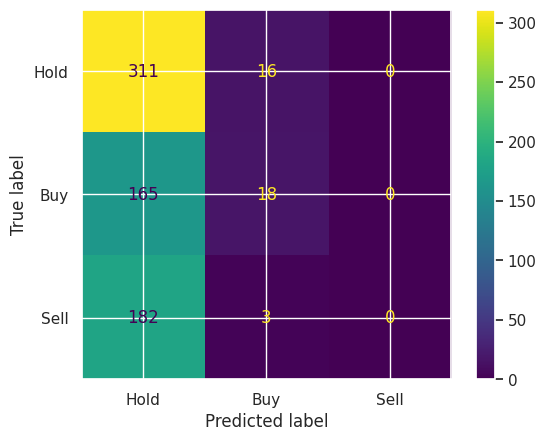

MA_CROSSOVER STRATEGY
Model: "sequential_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_6 (LSTM)                (None, 6, 128)            66560     
_________________________________________________________________
lstm_7 (LSTM)                (None, 64)                49408     
_________________________________________________________________
dense_8 (Dense)              (None, 32)                2080      
_________________________________________________________________
dense_9 (Dense)              (None, 3)                 99        
Total params: 118,147
Trainable params: 118,147
Non-trainable params: 0
_________________________________________________________________


<ipython-input-296-9ebf3e096880>:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  pred_data['Predictions'] = y_pred
/home/souhib/Projets/SFSU/Stock-Market-Prices/venv/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/souhib/Projets/SFSU/Stock-Market-Prices/venv/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this be

              precision    recall  f1-score   support

        Hold       0.83      1.00      0.91       576
         Buy       0.00      0.00      0.00        60
        Sell       0.00      0.00      0.00        59

    accuracy                           0.83       695
   macro avg       0.28      0.33      0.30       695
weighted avg       0.69      0.83      0.75       695



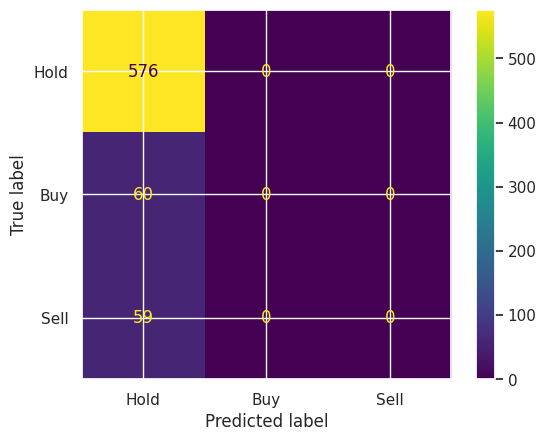

PCT_CHANGE STRATEGY
Model: "sequential_4"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_8 (LSTM)                (None, 6, 128)            66560     
_________________________________________________________________
lstm_9 (LSTM)                (None, 64)                49408     
_________________________________________________________________
dense_10 (Dense)             (None, 32)                2080      
_________________________________________________________________
dense_11 (Dense)             (None, 3)                 99        
Total params: 118,147
Trainable params: 118,147
Non-trainable params: 0
_________________________________________________________________
              precision    recall  f1-score   support

        Hold       0.27      0.82      0.41       184
         Buy       0.69      0.12      0.21       300
        Sell       0.63      0.27      0.38       211

    accu

<ipython-input-296-9ebf3e096880>:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  pred_data['Predictions'] = y_pred


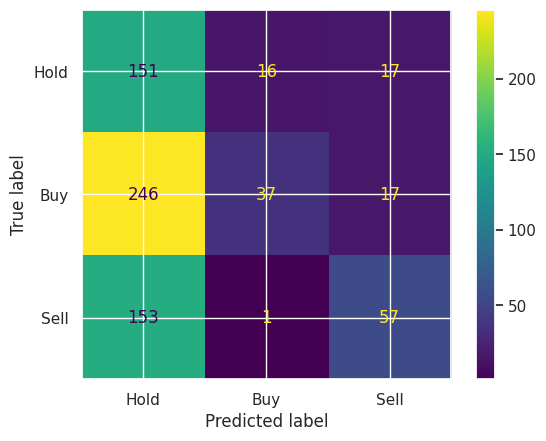

In [296]:
# High-tech Top-Down LSTM.
strategies = ['peaks', 'ma_crossover', 'pct_change']

company_symbol = 'AAPL'
market_symbol = '^IXIC' 
industry_symbol = '^NDXT'
sister_symbol = 'GOOG'

high_tech_predictions = {}

for strategy in strategies:
    print(strategy.upper() + ' STRATEGY')
    data = get_data_with_indicators(company_symbol, market_symbol, industry_symbol, sister_symbol, start='2013-01-01', end='2021-01-01', strategy=strategy)
    y_true, y_pred = predict_labels_lstm(data, train_split=0.65, verbose=0)
    # Save the results for simulation later.
    pred_data = data.tail(len(y_pred))
    pred_data['Predictions'] = y_pred
    high_tech_predictions[strategy] = pred_data.copy()
    # Show eval metrics
    calc_pred_metrics(y_true, y_pred)

#### 4.4.0.1 Automotive Company

PEAKS STRATEGY
Model: "sequential_5"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_10 (LSTM)               (None, 6, 128)            66560     
_________________________________________________________________
lstm_11 (LSTM)               (None, 64)                49408     
_________________________________________________________________
dense_12 (Dense)             (None, 32)                2080      
_________________________________________________________________
dense_13 (Dense)             (None, 3)                 99        
Total params: 118,147
Trainable params: 118,147
Non-trainable params: 0
_________________________________________________________________
              precision    recall  f1-score   support

        Hold       0.47      0.89      0.62       331
         Buy       0.00      0.00      0.00       180
        Sell       0.44      0.17      0.24       184

    accuracy 

<ipython-input-297-bc8cdf0d78a8>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  pred_data['Predictions'] = y_pred
/home/souhib/Projets/SFSU/Stock-Market-Prices/venv/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/souhib/Projets/SFSU/Stock-Market-Prices/venv/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this be

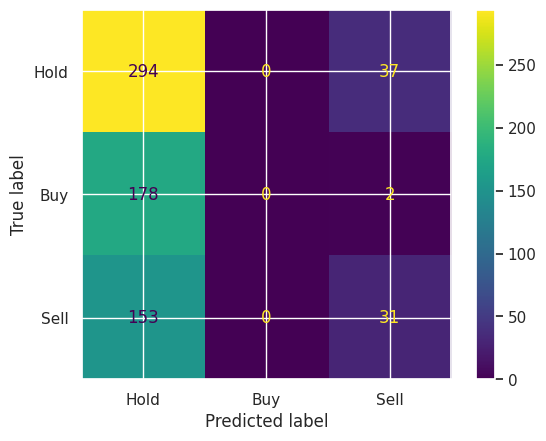

MA_CROSSOVER STRATEGY
Model: "sequential_6"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_12 (LSTM)               (None, 6, 128)            66560     
_________________________________________________________________
lstm_13 (LSTM)               (None, 64)                49408     
_________________________________________________________________
dense_14 (Dense)             (None, 32)                2080      
_________________________________________________________________
dense_15 (Dense)             (None, 3)                 99        
Total params: 118,147
Trainable params: 118,147
Non-trainable params: 0
_________________________________________________________________
              precision    recall  f1-score   support

        Hold       0.86      1.00      0.92       596
         Buy       0.00      0.00      0.00        50
        Sell       0.00      0.00      0.00        49

    ac

<ipython-input-297-bc8cdf0d78a8>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  pred_data['Predictions'] = y_pred
/home/souhib/Projets/SFSU/Stock-Market-Prices/venv/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/souhib/Projets/SFSU/Stock-Market-Prices/venv/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this be

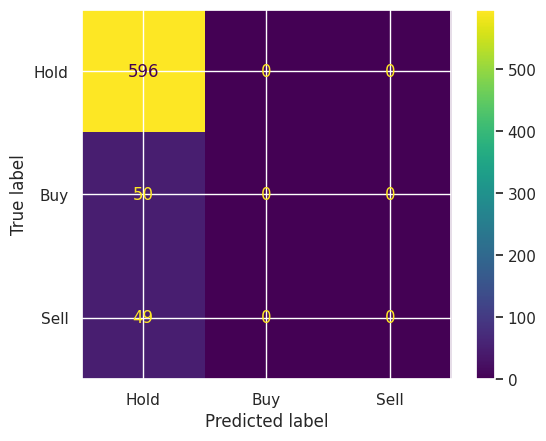

PCT_CHANGE STRATEGY
Model: "sequential_7"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_14 (LSTM)               (None, 6, 128)            66560     
_________________________________________________________________
lstm_15 (LSTM)               (None, 64)                49408     
_________________________________________________________________
dense_16 (Dense)             (None, 32)                2080      
_________________________________________________________________
dense_17 (Dense)             (None, 3)                 99        
Total params: 118,147
Trainable params: 118,147
Non-trainable params: 0
_________________________________________________________________
              precision    recall  f1-score   support

        Hold       0.00      0.00      0.00       108
         Buy       0.59      0.65      0.62       317
        Sell       0.52      0.67      0.59       270

    accu

<ipython-input-297-bc8cdf0d78a8>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  pred_data['Predictions'] = y_pred
/home/souhib/Projets/SFSU/Stock-Market-Prices/venv/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/souhib/Projets/SFSU/Stock-Market-Prices/venv/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this be

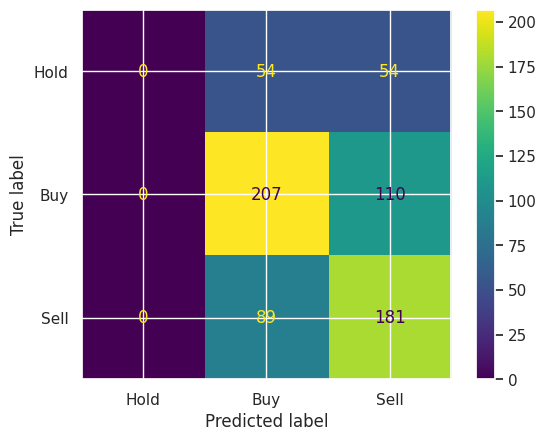

In [297]:
# Automotive Top-Down LSTM.

company_symbol = 'TSLA'
market_symbol = '^IXIC'
industry_symbol = 'CARZ'
sister_symbol = 'TM'

auto_predictions = {}

for strategy in strategies:
    print(strategy.upper() + ' STRATEGY')
    data = get_data_with_indicators(company_symbol, market_symbol, industry_symbol, sister_symbol, start='2013-01-01', end='2021-01-01', strategy=strategy)
    y_true, y_pred = predict_labels_lstm(data, train_split=0.65, verbose=0)
    # Save the results for simulation later.
    pred_data = data.tail(len(y_pred))
    pred_data['Predictions'] = y_pred
    auto_predictions[strategy] = pred_data.copy()
    # Show eval metrics
    calc_pred_metrics(y_true, y_pred)

### 4.4.1 Auto Keras

#### 4.4.1.0 High-tech Company

INFO:tensorflow:Oracle triggered exit
INFO:tensorflow:Assets written to: ./structured_data_classifier/best_model/assets
Loss : 1.0536218881607056

Accuracy : 0.4705035984516144

{'0': 695}
              precision    recall  f1-score   support

           0       0.47      1.00      0.64       327
           1       0.00      0.00      0.00       183
           2       0.00      0.00      0.00       185

    accuracy                           0.47       695
   macro avg       0.16      0.33      0.21       695
weighted avg       0.22      0.47      0.30       695

Prediction shape :  (695,)
X shape :  (695,)
              precision    recall  f1-score   support

        Hold       0.47      1.00      0.64       327
         Buy       0.00      0.00      0.00       183
        Sell       0.00      0.00      0.00       185

    accuracy                           0.47       695
   macro avg       0.16      0.33      0.21       695
weighted avg       0.22      0.47      0.30       695



/home/souhib/Projets/SFSU/Stock-Market-Prices/venv/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/souhib/Projets/SFSU/Stock-Market-Prices/venv/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/souhib/Projets/SFSU/Stock-Market-Prices/venv/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  

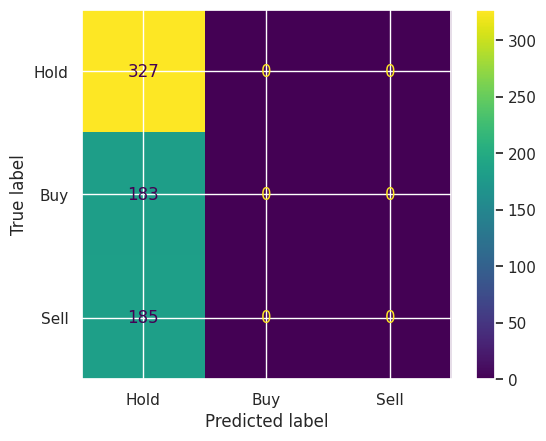

INFO:tensorflow:Reloading Oracle from existing project ./structured_data_classifier/oracle.json
INFO:tensorflow:Reloading Tuner from ./structured_data_classifier/tuner0.json
INFO:tensorflow:Oracle triggered exit
INFO:tensorflow:Assets written to: ./structured_data_classifier/best_model/assets
Loss : 0.8539142608642578

Accuracy : 0.8287769556045532

{'0.0': 695}
              precision    recall  f1-score   support

         0.0       0.83      1.00      0.91       576
         1.0       0.00      0.00      0.00        60
         2.0       0.00      0.00      0.00        59

    accuracy                           0.83       695
   macro avg       0.28      0.33      0.30       695
weighted avg       0.69      0.83      0.75       695

Prediction shape :  (695,)
X shape :  (695,)
              precision    recall  f1-score   support

        Hold       0.83      1.00      0.91       576
         Buy       0.00      0.00      0.00        60
        Sell       0.00      0.00      0.00   

/home/souhib/Projets/SFSU/Stock-Market-Prices/venv/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/souhib/Projets/SFSU/Stock-Market-Prices/venv/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/souhib/Projets/SFSU/Stock-Market-Prices/venv/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  

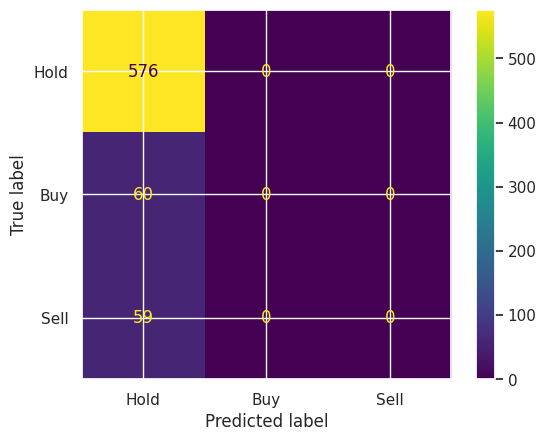

INFO:tensorflow:Reloading Oracle from existing project ./structured_data_classifier/oracle.json
INFO:tensorflow:Reloading Tuner from ./structured_data_classifier/tuner0.json
INFO:tensorflow:Oracle triggered exit
INFO:tensorflow:Assets written to: ./structured_data_classifier/best_model/assets
Loss : 1.1738677024841309

Accuracy : 0.3395683467388153

{'0': 561, '1': 6, '2': 128}
              precision    recall  f1-score   support

           0       0.28      0.85      0.42       184
           1       1.00      0.02      0.04       300
           2       0.58      0.35      0.44       211

    accuracy                           0.34       695
   macro avg       0.62      0.41      0.30       695
weighted avg       0.68      0.34      0.26       695

Prediction shape :  (695,)
X shape :  (695,)
              precision    recall  f1-score   support

        Hold       0.28      0.85      0.42       184
         Buy       1.00      0.02      0.04       300
        Sell       0.58      0

<ipython-input-309-9797084b465a>:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  pred_data['Predictions'] = auto_keras_tech_peak_predictions["Predictions"].values


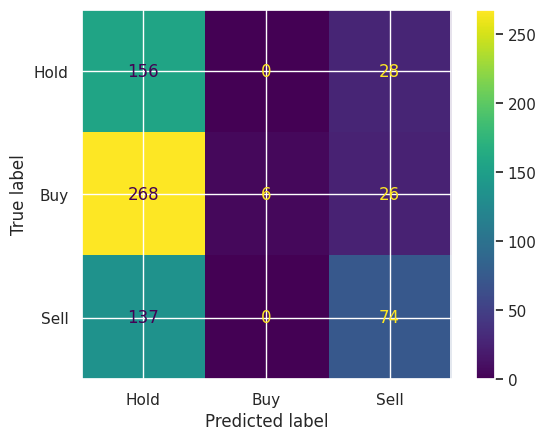

In [309]:
strategies = ['peaks', 'ma_crossover', 'pct_change']

company_symbol = 'AAPL'
market_symbol = '^IXIC' 
industry_symbol = '^NDXT'
sister_symbol = 'GOOG'

auto_keras_high_tech_predictions = {}

for strategy in strategies:
    data = get_data_with_indicators(company_symbol, market_symbol, industry_symbol, sister_symbol, start='2013-01-01', end='2021-01-01', strategy=strategy)
    auto_keras_tech_peak_predictions = auto_keras_training(company_symbol, market_symbol, industry_symbol, sister_symbol, strategy)
    # Save the results for simulation later.
    pred_data = data.tail(len(auto_keras_tech_peak_predictions["Predictions"]))
    pred_data['Predictions'] = auto_keras_tech_peak_predictions["Predictions"].values
    auto_keras_high_tech_predictions[strategy] = pred_data.copy()
    # Show eval metrics
    calc_pred_metrics(pred_data['Class'].astype(str), auto_keras_tech_peak_predictions['Predictions'].astype(str))

#### 4.4.1.1 Automotive Company

INFO:tensorflow:Reloading Oracle from existing project ./structured_data_classifier/oracle.json
INFO:tensorflow:Reloading Tuner from ./structured_data_classifier/tuner0.json
INFO:tensorflow:Oracle triggered exit
INFO:tensorflow:Assets written to: ./structured_data_classifier/best_model/assets
Loss : 1.708561658859253

Accuracy : 0.47338128089904785

{'0': 692, '2': 3}
              precision    recall  f1-score   support

           0       0.48      0.99      0.64       331
           1       0.00      0.00      0.00       180
           2       0.00      0.00      0.00       184

    accuracy                           0.47       695
   macro avg       0.16      0.33      0.21       695
weighted avg       0.23      0.47      0.31       695

Prediction shape :  (695,)
X shape :  (695,)
              precision    recall  f1-score   support

        Hold       0.48      0.99      0.64       331
         Buy       0.00      0.00      0.00       180
        Sell       0.00      0.00      0

/home/souhib/Projets/SFSU/Stock-Market-Prices/venv/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/souhib/Projets/SFSU/Stock-Market-Prices/venv/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/souhib/Projets/SFSU/Stock-Market-Prices/venv/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  

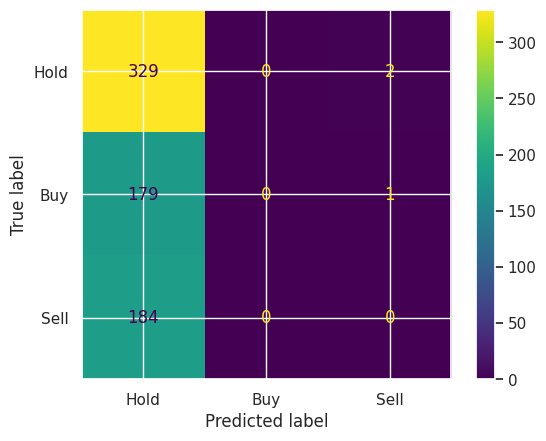

INFO:tensorflow:Reloading Oracle from existing project ./structured_data_classifier/oracle.json
INFO:tensorflow:Reloading Tuner from ./structured_data_classifier/tuner0.json
INFO:tensorflow:Oracle triggered exit
INFO:tensorflow:Assets written to: ./structured_data_classifier/best_model/assets
Loss : 0.7852371335029602

Accuracy : 0.804316520690918

{'0.0': 653, '1.0': 42}
              precision    recall  f1-score   support

         0.0       0.86      0.94      0.90       596
         1.0       0.00      0.00      0.00        50
         2.0       0.00      0.00      0.00        49

    accuracy                           0.80       695
   macro avg       0.29      0.31      0.30       695
weighted avg       0.73      0.80      0.77       695

Prediction shape :  (695,)
X shape :  (695,)
              precision    recall  f1-score   support

        Hold       0.86      0.94      0.90       596
         Buy       0.00      0.00      0.00        50
        Sell       0.00      0.00   

/home/souhib/Projets/SFSU/Stock-Market-Prices/venv/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/souhib/Projets/SFSU/Stock-Market-Prices/venv/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/souhib/Projets/SFSU/Stock-Market-Prices/venv/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  

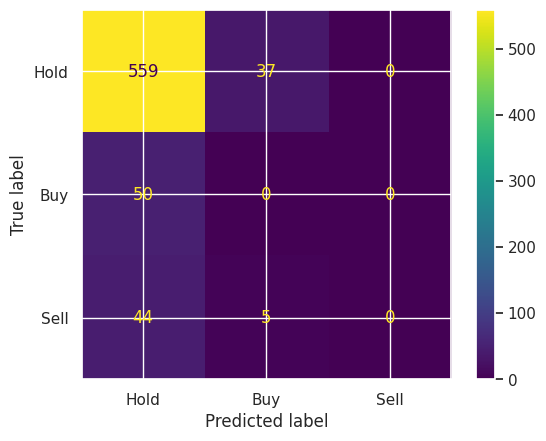

INFO:tensorflow:Reloading Oracle from existing project ./structured_data_classifier/oracle.json
INFO:tensorflow:Reloading Tuner from ./structured_data_classifier/tuner0.json
INFO:tensorflow:Oracle triggered exit
INFO:tensorflow:Assets written to: ./structured_data_classifier/best_model/assets
Loss : 1.082780122756958

Accuracy : 0.4978417158126831

{'0': 4, '1': 267, '2': 424}
              precision    recall  f1-score   support

           0       0.00      0.00      0.00       108
           1       0.56      0.47      0.51       317
           2       0.46      0.73      0.57       270

    accuracy                           0.50       695
   macro avg       0.34      0.40      0.36       695
weighted avg       0.44      0.50      0.45       695

Prediction shape :  (695,)
X shape :  (695,)
              precision    recall  f1-score   support

        Hold       0.00      0.00      0.00       108
         Buy       0.56      0.47      0.51       317
        Sell       0.46      0.

<ipython-input-332-1a56a4ada496>:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  pred_data['Predictions'] = auto_keras_tech_peak_predictions["Predictions"].values


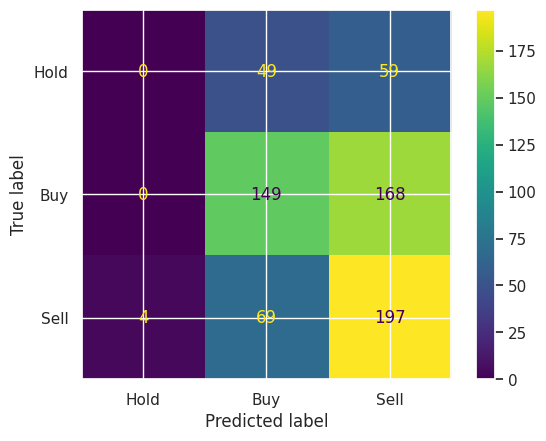

In [332]:
company_symbol = 'TSLA'
market_symbol = '^IXIC'
industry_symbol = 'CARZ'
sister_symbol = 'TM'

auto_keras_auto_predictions = {}

for strategy in strategies:
    data = get_data_with_indicators(company_symbol, market_symbol, industry_symbol, sister_symbol, start='2013-01-01', end='2021-01-01', strategy=strategy)
    auto_keras_tech_peak_predictions = auto_keras_training(company_symbol, market_symbol, industry_symbol, sister_symbol, strategy)
    # Save the results for simulation later.
    pred_data = data.tail(len(auto_keras_tech_peak_predictions["Predictions"]))
    pred_data['Predictions'] = auto_keras_tech_peak_predictions["Predictions"].values
    auto_keras_auto_predictions[strategy] = pred_data.copy()
    # Show eval metrics
    calc_pred_metrics(pred_data['Class'].astype(str), auto_keras_tech_peak_predictions['Predictions'].astype(str))

# 5. Stock Trade Simulations

In [311]:
# Simulates trade for the given data.
def sim_trade(data, class_col_name, funds=1000):
    shares = 0
    buy_count = 0
    sell_count = 0
    current_price = 0
    for index, row in data.iterrows():
        current_price = row['Adj Close']
        if int(float(row[class_col_name])) == 1 and funds != 0: # Buy
            qty = funds // current_price # How much we can buy
            funds -= current_price * qty
            shares += qty
            buy_count += 1
        elif int(float(row[class_col_name])) == 2 and shares != 0: # Sell
            funds += shares * current_price
            shares = 0
            sell_count += 1
    # If at the end we have shares, sell all to measure how much money we have.
    if shares != 0:
        sell_count +=1
        funds += shares * current_price
    print(f'Funds: ${funds:.2f}, Buys: {buy_count}, Sells: {sell_count}')

In [312]:
# High-tech Top-Down LSTM.

for strategy, data in high_tech_predictions.items():
    print(strategy.upper() + ' STRATEGY')
    print('Truth-based:')
    sim_trade(data, 'Class')
    print('Predictions-based:')
    sim_trade(data, 'Predictions')
    print()

PEAKS STRATEGY
Truth-based:
Funds: $342035.80, Buys: 183, Sells: 181
Predictions-based:
Funds: $3211.18, Buys: 37, Sells: 1

MA_CROSSOVER STRATEGY
Truth-based:
Funds: $1903.46, Buys: 60, Sells: 60
Predictions-based:
Funds: $1000.00, Buys: 0, Sells: 0

PCT_CHANGE STRATEGY
Truth-based:
Funds: $1094.56, Buys: 300, Sells: 133
Predictions-based:
Funds: $1347.36, Buys: 54, Sells: 12



In [313]:
# Automotive Top-Down LSTM.

for strategy, data in auto_predictions.items():
    print(strategy.upper() + ' STRATEGY')
    print('Truth-based:')
    sim_trade(data, 'Class')
    print('Predictions-based:')
    sim_trade(data, 'Predictions')
    print()

PEAKS STRATEGY
Truth-based:
Funds: $95156387.39, Buys: 180, Sells: 178
Predictions-based:
Funds: $1000.00, Buys: 0, Sells: 0

MA_CROSSOVER STRATEGY
Truth-based:
Funds: $7453.02, Buys: 50, Sells: 50
Predictions-based:
Funds: $1000.00, Buys: 0, Sells: 0

PCT_CHANGE STRATEGY
Truth-based:
Funds: $5738.83, Buys: 317, Sells: 149
Predictions-based:
Funds: $6294.87, Buys: 350, Sells: 46



In [314]:
# High-tech Auto Keras.

for strategy, data in auto_keras_high_tech_predictions.items():
    print(strategy.upper() + ' STRATEGY')
    print('Truth-based:')
    sim_trade(data, 'Class')
    print('Predictions-based:')
    sim_trade(data, 'Predictions')

PEAKS STRATEGY
Truth-based:
Funds: $342035.80, Buys: 183, Sells: 181
Predictions-based:
Funds: $1000.00, Buys: 0, Sells: 0
MA_CROSSOVER STRATEGY
Truth-based:
Funds: $1903.46, Buys: 60, Sells: 60
Predictions-based:
Funds: $1000.00, Buys: 0, Sells: 0
PCT_CHANGE STRATEGY
Truth-based:
Funds: $1094.56, Buys: 300, Sells: 133
Predictions-based:
Funds: $1034.50, Buys: 6, Sells: 2


In [331]:
# Automotive Auto Keras.

for strategy, data in auto_keras_auto_predictions.items():
    print(strategy.upper() + ' STRATEGY')
    print('Truth-based:')
    sim_trade(data, 'Class')
    print('Predictions-based:')
    sim_trade(data, 'Predictions')

PEAKS STRATEGY
Truth-based:
Funds: $95156387.39, Buys: 180, Sells: 178
Predictions-based:
Funds: $3859.75, Buys: 280, Sells: 35
MA_CROSSOVER STRATEGY
Truth-based:
Funds: $7453.02, Buys: 50, Sells: 50
Predictions-based:
Funds: $1000.00, Buys: 0, Sells: 0
PCT_CHANGE STRATEGY
Truth-based:
Funds: $5738.83, Buys: 317, Sells: 149
Predictions-based:
Funds: $1039.44, Buys: 225, Sells: 48


# 6. Conclusion

In this project, we applied data mining and machine learning techniques to predict stock prices and to create buy/sell/hold signals with the purpose of maximizing profits from stock trading. Although we achieved good results using our strategies, there is still room for improvement both in terms of feature/model engineering and the need for fundamental analysis and incorporation of additional data. Our results indicate that the future stock trends are not solely defined by the historical data and the technical indicators calculated from such data, and as such are difficult to predict without such additional information.

# 7. References

1. Application of integrated data mining techniques in stock market forecasting. https://www.tandfonline.com/doi/full/10.1080/23322039.2014.929505.
2. General stock market knowledge. https://www.investopedia.com.
3. Time Series Modeling Using Auto Arima With Python. https://betterprogramming.pub/using-auto-arima-with-python-e482e322f430.
4. Stock Market Analysis + Prediction using LSTM. https://www.kaggle.com/faressayah/stock-market-analysis-prediction-using-lstm.
5. Pandas TA - A Technical Analysis Library in Python 3. https://github.com/twopirllc/pandas-ta.
6. Sci-kit Learn - Machine Learning in Python. https://scikit-learn.org.
7. Facebook Prophet. https://facebook.github.io/prophet.